# Topic: World Energy Renewable Energy Consumption and Tracking the impact of key policies on renewable energy growth (US)

### Prepared by:

#### Name: Jennifer Agbo

#### Github Profile Link: https://jenamara-agbo.github.io/

#### Program: International and Development Economics (MA)

#### Course: Introduction to Python for Global Affairs (GLBL 5050)

#### Institution: Yale University

## Link to presentation slides: 
##### https://drive.google.com/file/d/1EaSL8te5OsBkcBr45XMjFYmG0wF82M60/view?usp=sharing

## Introduction

This research examines the impact of U.S. policy interventions on the adoption of renewable energy technologies and energy efficiency measures, exploring their influence on reducing greenhouse gas emissions and enhancing energy sustainability. The study investigates the relationship between renewable energy consumption and CO₂ emissions by analyzing historical trends and identifying turning points. Through data visualization and forecasting models, it provides insights into key policy impacts, highlighting areas for improvement and offering projections for renewable energy's future role in achieving climate goals.

## Research Objective:

To analyze how policy interventions in the United States have driven progress in renewable energy adoption and identify areas for further improvement. Since their implementation, how have specific U.S. policies influenced the growth and adoption of renewable energy technologies and energy efficiency measures?.

## Methods and Steps


Data Analysi: Policy Categorization and Trend Analysis; Key Metrics: Energy Savings, Reduction in GHGs, and, Growth in Renewable Energy.

Comparative Analysis - types of policies (e.g., subsidies, R&D funding, or efficiency standards)

Case Studies – Energy Efficient Mortgages or Clean Cities program (implementation and direct outcomes)

Visualization - Timelines or charts linking policy implementation to renewable energy growth or energy savings mil

## Data Sources: 

World Bank, Kaggle, IEA Policy Database, IRENA, EPA (Environment Protection Agency)stones



### Overall Data Cleaning done in the notebook

1. Handling Missing Values
2. Handling Date Columns 
3. Ensuring Numeric Columns
4. Removing Duplicates
5. Handling Categorical Columns
6. Data Grouping for Analysis
7. Handling Outliers
8. Preparing Data for Modeling
9. Verifying Data Integrity
10. Creating Derived Features
11. Formatting for Visualization
12. Managing Large Datasets: filtering and dropping unnecessary columns
13. Merging and Integrating Data

## Importing Packages

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import warnings

# Suppress all warnings
warnings.filterwarnings("ignore")

In [4]:
#!pip install pandas plotly geopandas pyshp

# World and Regional Energy Consumption Level
### What is the current state of Energy consumption in the world?

### First dataset: 

This dataset captures annual energy consumption (in terawatt-hours, TWh) for global regions, key international groups, and continents from 1990 to 2020. It highlights the energy demands of various regions, providing a comprehensive view of how consumption patterns have changed over time. Key variables include energy consumption data for the world, continents (e.g., North America, Europe, Asia, Africa), economic groups (e.g., OECD, BRICS), and specific regions (e.g., Middle-East, CIS). This dataset allows for a better understanding of regional energy demands, industrial growth, and trends in energy transition.

##### Variable Descriptions:

Year: The calendar year corresponding to the recorded energy consumption values (1990–2020).
World: Total global energy consumption in TWh. Others include the Energy consumption of OECD (Organisation for Economic Co-operation and Development countries (developed nations)), BRICS countries (Brazil, Russia, India, China, and South Africa), Europe, North America, Latin America, Asia, Africa, Middle-East, CIS (Commonwealth of Independent States)

Downloaded from https://www.kaggle.com/datasets/jamesvandenberg/renewable-power-generation?select=Continent_Consumption_TWH.csv

### Data cleaning

In [8]:
# Read the data
csv_file = "Continent_Energy_Consumption_Data.csv"
df1 = pd.read_csv(csv_file)

# Drop the 'World' region from the dataset
df = df1.drop(columns=["World"])

# Set the 'Year' column as the index
df1.set_index('Year', inplace=True)

df1.head()

,World,OECD,BRICS,Europe,North America,Latin America,Asia,Pacific,Africa,Middle-East,CIS
Year,,,,,,,,,,,
1990,101855.54,52602.49,26621.07,20654.88,24667.23,5373.06,24574.19,1197.89,4407.77,2581.86,16049.40
1991,102483.56,53207.25,26434.99,20631.62,24841.68,5500.99,24783.53,1186.26,4535.70,2744.68,15898.21
1992,102588.23,53788.75,25993.05,20189.68,25341.77,5628.92,25690.67,1209.52,4582.22,3081.95,14339.79
1993,103646.56,54614.48,26283.80,20189.68,25830.23,5675.44,26876.93,1267.67,4721.78,3349.44,13246.57
1994,104449.03,55579.77,25993.05,20085.01,26365.21,5989.45,28098.08,1279.30,4803.19,3640.19,11606.74


### Data Visualization and Analysis

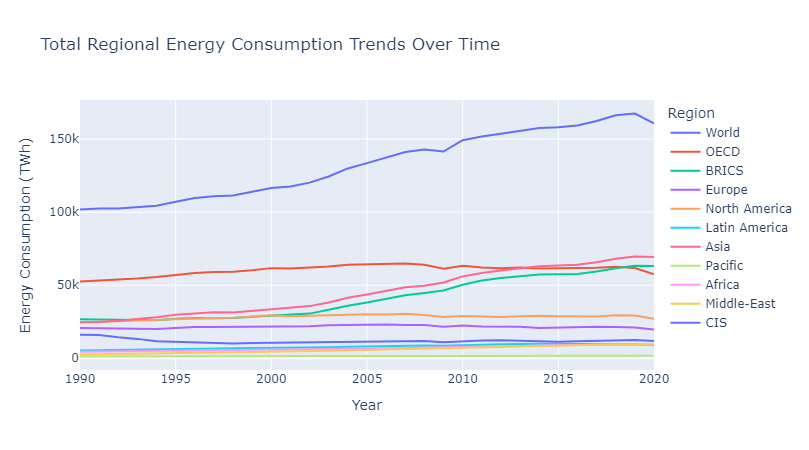

In [10]:
# Transform the data into a long format for easier plotting
df1_long = df1.reset_index().melt(id_vars=["Year"], var_name="Region", value_name="Value")

# Create a line chart to visualize trends for each region over time
fig = px.line(
    df1_long,
    x="Year",
    y="Value",
    color="Region",
    title="Total Regional Energy Consumption Trends Over Time",
    labels={"Value": "Energy Consumption (TWh)", "Year": "Year", "Region": "Region"}
)

# Adjust the size of the graph
fig.update_layout(
    width=800,  # Set the width of the graph
    height=450   # Set the height of the graph
)

# Display the chart
fig.show()

##### Insights: 

The graph above shows that Asia and BRICS regions have driven significant growth in global energy consumption since 1990, reflecting rapid industrialization and economic expansion, particularly in China and India. In contrast, OECD and Europe show stable consumption trends, indicating improved energy efficiency and a shift towards renewables. North America’s energy demand plateaued after 2010, while Africa and the Pacific regions remain the lowest consumers, highlighting energy access disparities. The COVID-19 pandemic caused a noticeable dip in 2020 across most regions. Overall, emerging economies are increasing global energy growth, while developed nations focus on efficiency and sustainability.

## Which Countries are the Major Energy Consumers over time?

### Second Dataset: 

Energy Consumption by Country—The dataset provides energy consumption data (in terawatt-hours, TWh) for various countries from 1990 to 1999. It includes major economies like China, the United States, and Germany, as well as emerging nations such as India and Brazil. The data enables a comparative analysis of global energy consumption trends across regions and countries.

Key insights I hope to identify are leading energy consumers (e.g., the United States and China) and tracking rapid growth in emerging economies like India. The dataset will help me understand historical energy demand distribution and highlight disparities between developed and developing countries.

Downloaded from: https://www.kaggle.com/datasets/jamesvandenberg/renewable-power-generation?select=Country_Consumption_TWH.csv

### Data Cleaning

In [14]:
# Read the dataset from a CSV file
csv_file = "Country_Consumption_TWH.csv"  
df2 = pd.read_csv(csv_file)

# Handle non-finite values in the 'Year' column
df2['Year'] = pd.to_numeric(df2['Year'], errors='coerce')  # Convert to numeric, setting invalid entries to NaN
df2.dropna(subset=['Year'], inplace=True)                 # Drop rows with NaN in 'Year'
df2['Year'] = df2['Year'].astype(int)                     # Convert cleaned 'Year' to integer

# Set 'Year' as the index (for permanent indexing)
df2.set_index('Year', inplace=True)

df2.head()

,China,United States,Brazil,Belgium,Czechia,France,Germany,Italy,Netherlands,Poland,...,Australia,New Zealand,Algeria,Egypt,Nigeria,South Africa,Iran,Kuwait,Saudi Arabia,United Arab Emirates
Year,,,,,,,,,,,,,,,,,,,,,
1990,874.0,1910.0,141.0,48.0,50.0,225.0,351.0,147.0,67.0,103.0,...,86.0,14.0,22.0,33.0,66.0,90.0,69.0,9.0,58.0,20.0
1991,848.0,1925.0,143.0,50.0,45.0,237.0,344.0,150.0,69.0,101.0,...,85.0,14.0,23.0,33.0,70.0,92.0,77.0,3.0,68.0,23.0
1992,877.0,1964.0,145.0,51.0,44.0,234.0,338.0,149.0,69.0,99.0,...,87.0,14.0,24.0,34.0,72.0,88.0,81.0,9.0,77.0,22.0
1993,929.0,1998.0,148.0,49.0,43.0,238.0,335.0,149.0,70.0,101.0,...,91.0,15.0,24.0,35.0,74.0,94.0,87.0,12.0,80.0,23.0
1994,973.0,2036.0,156.0,52.0,41.0,231.0,333.0,147.0,70.0,96.0,...,91.0,15.0,23.0,34.0,72.0,98.0,97.0,14.0,84.0,26.0


### Data Visualization and analysis

In [16]:
# Reshape the dataset to a long format for mapping
df2_long = df2.reset_index().melt(id_vars=["Year"], var_name="Country", value_name="Energy Consumption")

# Plot the choropleth map with a custom legend
fig = px.choropleth(
    df2_long,
    locations="Country",                  # Column with country names
    locationmode="country names",         # Match country names with geographic data
    color="Energy Consumption",           # Values to color by
    hover_name="Country",                 # Display country name on hover
    animation_frame="Year",               # Add a slider for years
    title="Energy Consumption by Country Over Time",
    color_continuous_scale=px.colors.sequential.Plasma
)

# Customize the color legend
fig.update_layout(
    coloraxis_colorbar=dict(
        title="Energy Consumption (TWh)",  # Title of the legend
        tickprefix="",                     # Optional: Add units or symbols to ticks
        ticks="outside",                   # Style the ticks outside the bar
        ticklen=5,                         # Tick length
        showticksuffix="last"              # Show suffix only on the last tick
    ),
    geo=dict(
        showcoastlines=True,
        showland=True,
        showocean=True,
        landcolor="white",
        oceancolor="lightblue"
    ),
    height=600,  # Adjust map height
    width=1000   # Adjust map width
)

# Display the map
fig.show()


### Insights:

China has overtaken the United States as the leading energy consumer in the last two decades, reflecting its rapid industrialization and economic growth. India, while starting with relatively lower energy consumption, has shown consistent and significant growth, establishing itself as a rising energy consumer. Russia and Brazil also exhibit upward trends, with steady increases over time. The data highlights a shift in global energy consumption from traditional leaders like the U.S. to emerging economies, particularly in Asia. These trends emphasize the growing energy demands of developing nations as their economies expand.

# World and Regional Emmision Levels

### What is the level of CO2 Consumed by these countries? 

Has is reduced or not? What specifically is the trend in the US emissions level? Which countries have historically contributed the most to global emissions, and how has this changed over time?

#### Third Dataset:
The dataset provides a detailed, country-specific breakdown of total CO₂ emissions starting from 1750, organized by year and country with their respective ISO 3166-1 alpha-3 codes. It captures the historical trends in CO₂ emissions, starting from periods of zero or negligible emissions in many countries' early industrial era. By aggregating total emissions over time, this dataset helps evaluate the rise in global emissions and correlate them with industrial and economic events.

Download data: https://www.kaggle.com/datasets/thedevastator/global-fossil-co2-emissions-by-country-2002-2022

#### Read in data and Clean

In [21]:
# Load the dataset
csv_file = "GCB2022v27_MtCO2_flat.csv"  # Replace with the actual file path
df3 = pd.read_csv(csv_file)

# Clean the data
df3['Year'] = pd.to_numeric(df3['Year'], errors='coerce')  # To ensure 'Year' is numeric
df3['Total'] = pd.to_numeric(df3['Total'], errors='coerce')  #To ensure 'Total' is numeric
df3.dropna(subset=['Year', 'Total'], inplace=True)  # Remove rows with missing data
df3['Year'] = df3['Year'].astype(int)  # Convert 'Year' to integer

# Make 'Year' the index
df3.set_index('Year', inplace=True)

# Display the first few rows
df3.head()


,Country,ISO 3166-1 alpha-3,Total,Coal,Oil,Gas,Cement,Flaring,Other,Per Capita
Year,,,,,,,,,,
1750,Afghanistan,AFG,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1751,Afghanistan,AFG,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1752,Afghanistan,AFG,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1753,Afghanistan,AFG,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1754,Afghanistan,AFG,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### Filter, Drop, Group by and Sort

In [23]:
# Reset index to treat 'Year' as a column for filtering
df_filtered = df3.reset_index()

# Filter the data to start from 1950
df_filtered = df_filtered[df_filtered['Year'] >= 1950]

# Exclude "Global" and "International Transport" entries
excluded_countries = ["Global", "International Transport"]
df_filtered = df_filtered[~df_filtered["Country"].isin(excluded_countries)]

# Set 'Year' back as the index
df_filtered.set_index("Year", inplace=True)

# Group by Country and calculate total CO₂ emissions
total_emissions = df_filtered.groupby("Country")["Total"].sum().reset_index()

# Sort by total emissions in descending order and select the top 10
top_10_countries = total_emissions.sort_values(by="Total", ascending=False).head(10)

# Display the top 10 countries
print(top_10_countries)


            Country          Total
216             USA  332460.511065
41            China  247160.496446
169          Russia  111285.200691
77          Germany   64610.489678
100           Japan   62696.636327
92            India   55167.754309
220  United Kingdom   39850.132173
36           Canada   29763.311155
218         Ukraine   28798.198251
69           France   27423.861054


 #### Quick Data Visualization - Total CO2 Consumption Over time

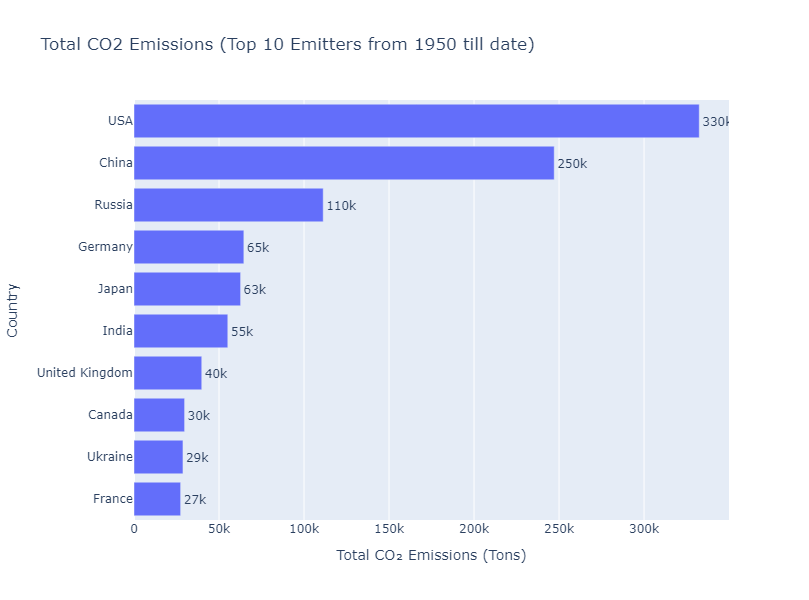

In [25]:
# Create a bar chart
fig = px.bar(
    top_10_countries,
    x="Total",
    y="Country",
    orientation='h',  # Horizontal bar chart
    title="Total CO2 Emissions (Top 10 Emitters from 1950 till date)",
    labels={"Total": "Total CO₂ Emissions", "Country": "Country"},
    text="Total"  # Display values on the bars
)

# Customize layout
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')  # Format bar labels
fig.update_layout(
    xaxis=dict(title="Total CO₂ Emissions (Tons)"),
    yaxis=dict(title="Country", categoryorder="total ascending"),  # Sort by emissions
    height=600, width=800  # Adjust size
)

# Display the chart
fig.show()


#### Insights

The bar chart above showcases the top 10 countries by total CO₂ emissions from 1950 onward. The United States leads with approximately 330k tons, followed by China with 250k tons. Russia is third, contributing 110k tons, highlighting its historical and industrial footprint. European nations like Germany, the United Kingdom, France, and Ukraine are significant contributors, reflecting their industrial growth over the decades. Emerging economies like India show growing emissions at 55k tons, emphasizing their rapid industrialization. Overall, the chart highlights the dominant role of industrialized nations in historical CO₂ emissions.

# Did Power Change Hands? Who is the current top Emitter? 

## Further Investigation into Emissions Trends Over Time


What can we say about yearly emissions over time? From earlier visualizations, it was evident that China has overtaken the US in energy consumption. If this trend is consistent with CO₂ emissions, can we pinpoint when China surpassed the US as the leading emitter. This transition will likely reflect China's rapid industrial growth and increasing reliance on fossil fuels, particularly coal, during the 21st century. Understanding this shift is crucial for identifying global trends in emissions and their relationship to industrialization and energy consumption.

#### Group By, Rank, and select Top 10 Emitters

In [29]:
# Group by Year and Country and calculate total CO₂ emissions
df_grouped = df_filtered.groupby(["Year", "Country"])["Total"].sum().reset_index()

# Rank countries by emissions for each year
df_grouped["Rank"] = df_grouped.groupby("Year")["Total"].rank(method="first", ascending=False)

# Select the top 10 emitters for each year
top_10_df = df_grouped[df_grouped["Rank"] <= 10]

#### Quick Data Visualization

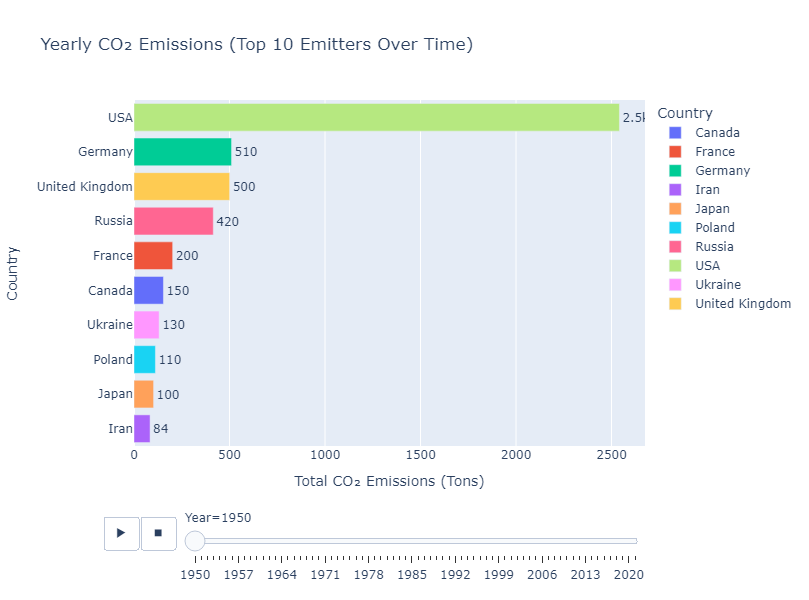

In [31]:
# Create an animated bar chart to show emissions trends over time
fig = px.bar(
    top_10_df,
    x="Total",
    y="Country",
    color="Country",
    animation_frame="Year",
    orientation='h',  # Horizontal bar chart
    title="Yearly CO₂ Emissions (Top 10 Emitters Over Time)",
    labels={"Total": "Total CO₂ Emissions (Tons)", "Country": "Country"},
    text="Total"  # Display values on the bars
)

# Customize the layout
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')  # Format bar labels
fig.update_layout(
    xaxis=dict(title="Total CO₂ Emissions (Tons)"),
    yaxis=dict(title="Country", categoryorder="total ascending"),  # Sort y-axis dynamically
    height=600, width=800  # Adjust chart size
)

# Display the animated chart
fig.show()

### Inisghts:

China surpassed the United States as the top CO₂ emitter around 2005 and remains the leader, driven by industrialization. India’s emissions have risen sharply, making it the third-largest emitter by 2021. While emissions from developed countries like Russia, Japan, and Germany have stabilized or declined, emerging economies such as Indonesia and Saudi Arabia are now among the top 10 emitters due to growing industrial activity.

#### Another Quick Visualization to provide clarity in trends

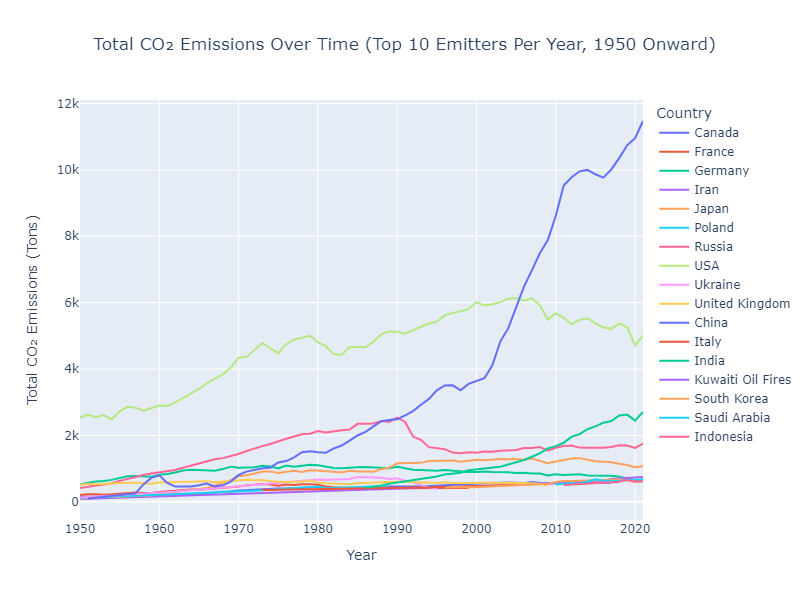

In [34]:
# Create a line graph for emissions over time using the same filtered dataset
fig = px.line(
    top_10_df,  # Use the dataset from the animated bar chart
    x="Year",
    y="Total",
    color="Country",
    title="Total CO₂ Emissions Over Time (Top 10 Emitters Per Year, 1950 Onward)",
    labels={"Total": "Total CO₂ Emissions (Tons)", "Year": "Year", "Country": "Country"}
)

# Customize layout
fig.update_layout(
    xaxis=dict(title="Year"),
    yaxis=dict(title="Total CO₂ Emissions (Tons)"),
    height=600, width=1000,  # Adjust chart size
    legend_title=dict(text="Country"),  # Add legend title
    title_x=0.5  # Center the title
)

# Display the chart
fig.show()


### Insights:

China surpassed the USA as the top CO₂ emitter around 2006. India shows steady growth, while emissions from the USA and Russia have stabilized or declined.

# GDP and CO2 Emission of Top Emitters
### Is there a correlation?

What has been the relationship between CO₂ emissions and these countries' GDP over time?

### Dataset
The dataset I used enables comparisons across countries and time periods to identify patterns like shifts in top emitters.

Downloaded from: https://www.kaggle.com/datasets/cracc97/top10-countries-co2gdptradeopeness

### Data Cleaning

In [ ]:
# Load the dataset
csv_file = "Complete DS 2.csv"  # Replace with your actual file path
df = pd.read_csv(csv_file)

# Clean the data
df = df.dropna(how="all", axis=1)  # Drop columns with all NaN values
df = df.dropna(how="all")          # Drop rows with all NaN values
df = df.fillna(0)                  # Replace remaining NaN values with 0

# Melt the dataset to long format for easier analysis
df_melted = df.melt(
    id_vars=["Country Name", "Country Code", "Indicator Name", "Indicator Code"],
    var_name="Year",
    value_name="Value"
)
df_melted["Year"] = pd.to_numeric(df_melted["Year"], errors="coerce")  # Convert Year to numeric

### Filtering, droping NaN values and converting to long Data

In [ ]:
# Filter for GDP and CO₂ emissions for the years 1970-2018
key_indicators = ["CO2 emissions (kt)", "GDP (current US$)"]
df_filtered = df_melted[
    (df_melted["Indicator Name"].isin(key_indicators)) & 
    (df_melted["Year"] >= 1970) & 
    (df_melted["Year"] <= 2018)
]

# Pivot the dataset to align metrics as separate columns
df_pivot = df_filtered.pivot_table(
    index=["Country Name", "Year"],
    columns="Indicator Name",
    values="Value",
    aggfunc="sum"
).reset_index()

# Filter for US, China, and India
countries_of_interest = ["United States", "China", "India"]
df_countries = df_pivot[df_pivot["Country Name"].isin(countries_of_interest)]

# Ensure numeric conversion for GDP and CO₂ emissions and remove rows with NaN or 0
df_countries["CO2 emissions (kt)"] = pd.to_numeric(df_countries["CO2 emissions (kt)"], errors="coerce")
df_countries["GDP (current US$)"] = pd.to_numeric(df_countries["GDP (current US$)"], errors="coerce")

# Replace zeros with NaN to avoid plotting issues, then drop NaN
df_countries.replace(0, np.nan, inplace=True)
df_countries.dropna(subset=["CO2 emissions (kt)", "GDP (current US$)"], inplace=True)

### Data Visualization - Unscaled Values

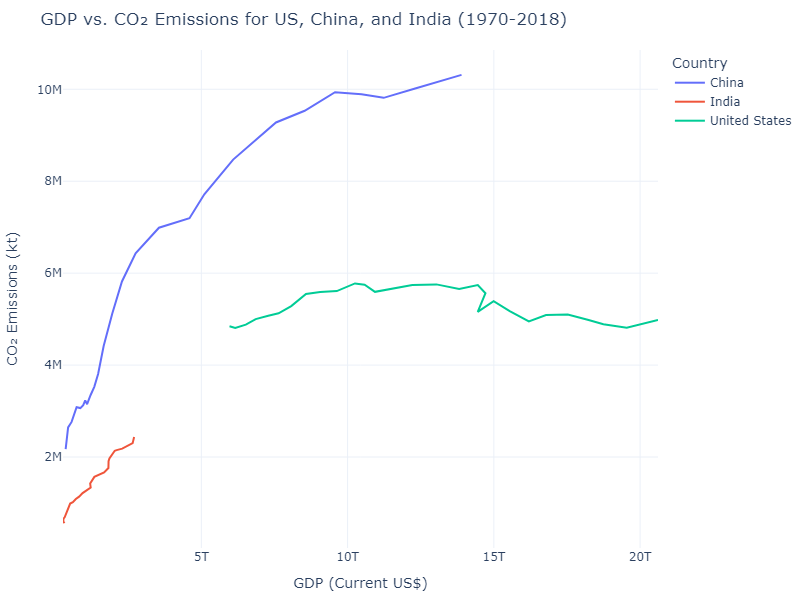

In [287]:
# Create a line plot combining all countries
fig = px.line(
    df_countries,
    x="GDP (current US$)",
    y="CO2 emissions (kt)",
    color="Country Name",  # Differentiates countries by color
    title="GDP vs. CO₂ Emissions for US, China, and India (1970-2018)",
    labels={"GDP (current US$)": "GDP (Current US$)", "CO2 emissions (kt)": "CO₂ Emissions (kt)", "Country Name": "Country"},
    template="plotly_white",
)

# Customize layout
fig.update_layout(
    xaxis_title="GDP (Current US$)",
    yaxis_title="CO₂ Emissions (kt)",
    margin=dict(l=50, r=50, t=50, b=50),
    height=600,
    width=900
)

# Display the chart
fig.show()


#### Insights:

United States (Green Line): Compared to the other countries, the U.S. starts with a high GDP. CO₂ emissions remain relatively stable over time, peaking at around 8–10 million kilotons in the early years before slightly declining despite continuous GDP growth. This trend suggests that economic growth in the U.S. has become decoupled from increasing emissions, likely due to advancements in energy efficiency, shifts to renewable energy, or offshoring of emissions-intensive industries.

China (Blue Line): China started with a low GDP and CO₂ emissions in the 1970s but shows rapid growth in both metrics. Around the mid-point of the timeline, there is a significant increase in CO₂ emissions, peaking near 10 million kilotons while GDP also surges. This trend reflects China’s industrialization and heavy reliance on coal and fossil fuels to support economic growth during this period.

India (Red Line): India starts with the lowest GDP and CO₂ emissions among the three countries. Both GDP and CO₂ emissions grow steadily but at a slower rate compared to China. The relatively modest rise in emissions compared to GDP may indicate that India’s economic growth has been less emission-intensive or that its development has been less industrial-heavy compared to China.

### Normalization - putting the countries on the same scale

In [401]:
# Normalize both GDP and CO₂ emissions within each country
df_countries["Normalized GDP"] = df_countries.groupby("Country Name")["GDP (current US$)"].transform(
    lambda x: (x - x.min()) / (x.max() - x.min())
)
df_countries["Normalized CO2 Emissions"] = df_countries.groupby("Country Name")["CO2 emissions (kt)"].transform(
    lambda x: (x - x.min()) / (x.max() - x.min())
)

# Melt the normalized data for plotting
df_normalized = df_countries.melt(
    id_vars=["Country Name", "Year"],
    value_vars=["Normalized GDP", "Normalized CO2 Emissions"],
    var_name="Metric",
    value_name="Normalized Value"
)


### Data Visualization

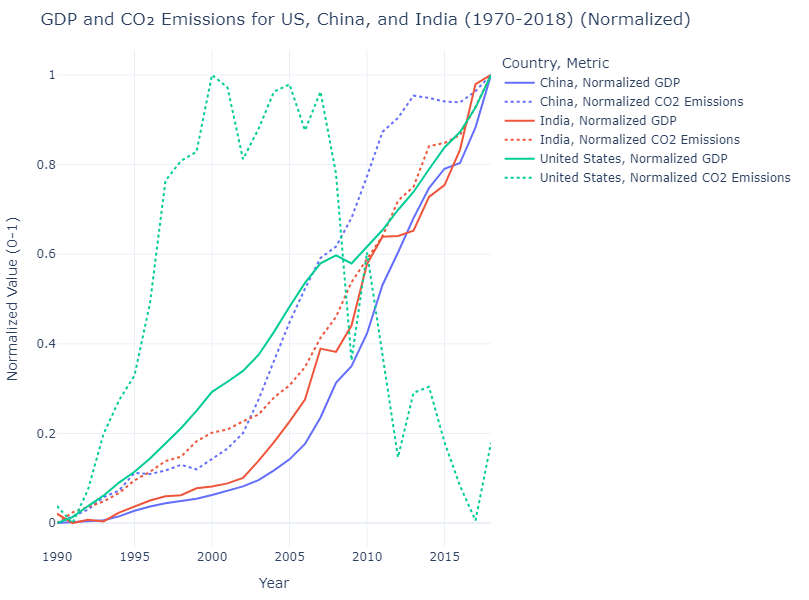

In [297]:
# Create a line plot with normalized values
fig = px.line(
    df_normalized,
    x="Year",
    y="Normalized Value",
    color="Country Name",
    line_dash="Metric",  # Differentiate GDP and CO₂ emissions by line style
    title="GDP and CO₂ Emissions for US, China, and India (1970-2018) (Normalized)",
    labels={"Normalized Value": "Normalized Value (0-1)", "Year": "Year", "Country Name": "Country"},
    template="plotly_white",
)

# Customize layout
fig.update_layout(
    xaxis_title="Year",
    yaxis_title="Normalized Value (0-1)",
    margin=dict(l=50, r=50, t=50, b=50),
    height=600,
    width=900,
)

# Display the chart
fig.show()


#### Insights:

This graph complements the previous insights. However, it presents a normalized comparison of GDP and CO₂ emissions for the United States, China, and India from 1990 to 2018. Normalizing the data (scaling each metric to a range of 0–1) allows for the observation of the relative growth trends of GDP and CO₂ emissions for each country rather than their absolute values. 

# GLOBAL RENEWABLE ENERGY

### How can US power generation be compared to that of the other top countries?

### Dataset:

This dataset shows the top countries' renewable energy power generation capacity. 
Downloaded from: https://www.kaggle.com/datasets/jamesvandenberg/renewable-power-generation

### Data cleaning

In [454]:
# Load the dataset
csv_file = "top20CountriesPowerGeneration.csv"  # Replace with your actual file path
df = pd.read_csv(csv_file)

# Clean and inspect the data
df = df.fillna(0)  # Replace any NaN values with 0
print(df.head())  # Preview the data structure

  Country  Hydro(TWh)  Biofuel(TWh)  Solar PV (TWh)  Geothermal (TWh)  \
0   China     1189.84        295.02           79.43             0.125   
1     USA      315.62        277.91           58.95            18.960   
2  Brazil      370.90         42.37           52.25             0.000   
3  Canada      383.48         29.65            7.12             0.000   
4   India      141.80         51.06           43.76             0.000   

   Total (TWh)  
0     1819.940  
1      758.619  
2      466.350  
3      424.090  
4      262.650  


### Data visualization -  U.S., China, and India

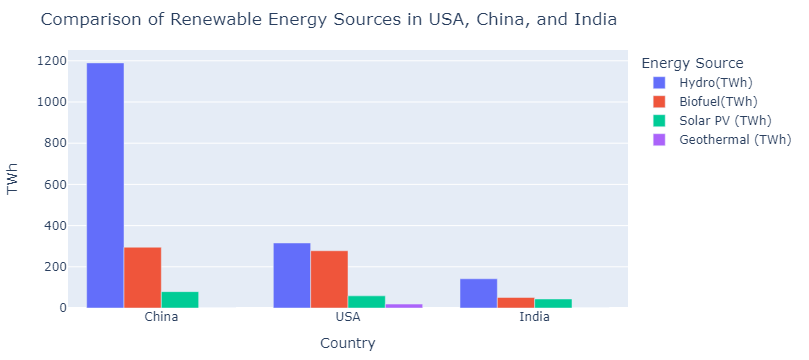

In [456]:
# Comparison of Renewables in U.S., China, and India
selected_countries = ["USA", "China", "India"]
df_selected = df[df["Country"].isin(selected_countries)].melt(
    id_vars=["Country", "Total (TWh)"],
    value_vars=renewable_sources,
    var_name="Energy Source",
    value_name="TWh"
)

fig_compare = px.bar(
    df_selected,
    x="Country",
    y="TWh",
    color="Energy Source",
    title="Comparison of Renewable Energy Sources in USA, China, and India",
    barmode="group",
    height=600
)
fig_compare.update_layout(margin=dict(l=50, r=50, t=50, b=50))
fig_compare.show()

### Insights:

China leads by a significant margin in hydropower generation, producing over 1200 TWh. Interestingly, the USA comes second in hydropower generation, producing less than half of China's output. India's hydropower, as well as other renewable energy contributions, is relatively low compared to China and the USA. Biofuel generation is nearly comparable in the USA and China, with both countries producing substantial amounts, reflecting efforts to incorporate alternative fuels in their energy mix. China again dominates in Solar PV (Photovoltaic) energy, although the US is making significant strides in Solar PV. China leads in all renewable energy sources except geothermal, while the US is more diversified.

# Global Trends in Renewable Energy Power Generation

### Fourth Dataset:

The dataset explores global renewable energy trends, focusing on electricity generation (in GWh) across various energy sources such as solar, wind, hydro, geothermal, and bioenergy from 2000 to 2023. Countries like China, the United States, and India show significant contributions to renewable energy, particularly in solar and wind energy. This analysis aids in understanding regional disparities and advancements in renewable energy technologies.

Downloaded from: https://www.irena.org/Publications/2024/Jul/Renewable-energy-statistics-2024

### Read the data in and clean

In [10]:
# Load the dataset
csv_file = "IRENA_Stats_extract_2024 H2.csv"  # Replace with your actual file path
df = pd.read_csv(csv_file)

### Solar Energy Power Generation over time across region

In [12]:
# Filter data for Solar Energy
df_solar = df[
    (df["Group Technology"].str.contains("Solar", case=False, na=False)) | 
    (df["Technology"].str.contains("Solar", case=False, na=False))
]

# Filter data for years from 2000 to 2022
df_solar = df_solar[(df_solar["Year"] >= 2000) & (df_solar["Year"] <= 2022)]

# Replace missing or zero values with a small default value
df_solar["Electricity Generation (GWh)"] = df_solar["Electricity Generation (GWh)"].replace(0, 0.1).fillna(0.1)

# Apply logarithmic scaling for better visual differentiation
df_solar["Log Electricity Generation (GWh)"] = df_solar["Electricity Generation (GWh)"].apply(lambda x: max(x, 1)).apply(np.log)

# Sort the dataset by Year
df_solar = df_solar.sort_values(by="Year")

### Data Visualization

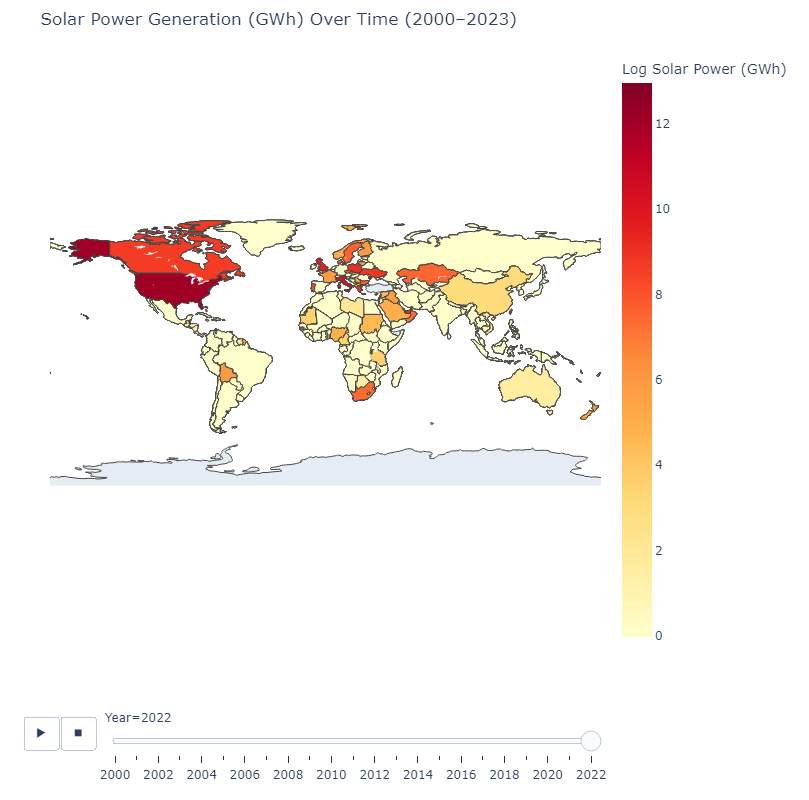

In [14]:
# Plot a world map with year slider
fig = px.choropleth(
    df_solar,
    locations="Country",
    locationmode="country names",
    color="Log Electricity Generation (GWh)",  # Use the log-transformed values
    hover_name="Country",
    animation_frame="Year",
    title="Solar Power Generation (GWh) Over Time (2000–2023)",
    color_continuous_scale=px.colors.sequential.YlOrRd,
    range_color=(0, df_solar["Log Electricity Generation (GWh)"].max())  # Set consistent range for log scale
)

# Customize the layout
fig.update_layout(
    geo=dict(
        showframe=False, 
        showcoastlines=True, 
        projection_type="equirectangular"
    ),
    coloraxis_colorbar=dict(
        title="Log Solar Power (GWh)"
    ),
    margin=dict(l=50, r=50, t=50, b=50),
    width=1100,  # Set a larger width
    height=800   # Set a larger height
)

# Show the map
fig.show()


#### Insights:

This shows the dominance of the United States and Canada in Solar energy production, with vibrant colors representing higher levels of electricity generation. Some countries in Europe, such as Germany and France, also display significant contributions. However, much of the developing world, including large portions of Africa and Asia (China and India, more specifically), lags behind in Solar Energy generation.

### Wind Energy Power Generation over time across region

In [16]:
# Filter the dataset for Wind Energy
df_wind = df[
    (df["Group Technology"].str.contains("Wind", case=False, na=False)) & 
    (df["Technology"].str.contains("Wind", case=False, na=False))&
    (df["Producer Type"].str.contains("On-grid electricity", case=False, na=False))
]

# Filter data for years from 2000 to 2023
df_wind = df_wind[(df_wind["Year"] >= 2000) & (df_wind["Year"] <= 2021)]

# Replace missing or zero values with a small default value
df_wind["Electricity Generation (GWh)"] = df_wind["Electricity Generation (GWh)"].replace(0, 0.1).fillna(0.1)

# Apply logarithmic scaling for better visualization
df_wind["Log Electricity Generation (GWh)"] = df_wind["Electricity Generation (GWh)"].apply(lambda x: max(x, 1)).apply(np.log)

# Sort the dataset by Year
df_wind = df_wind.sort_values(by="Year")

### Data Visualization

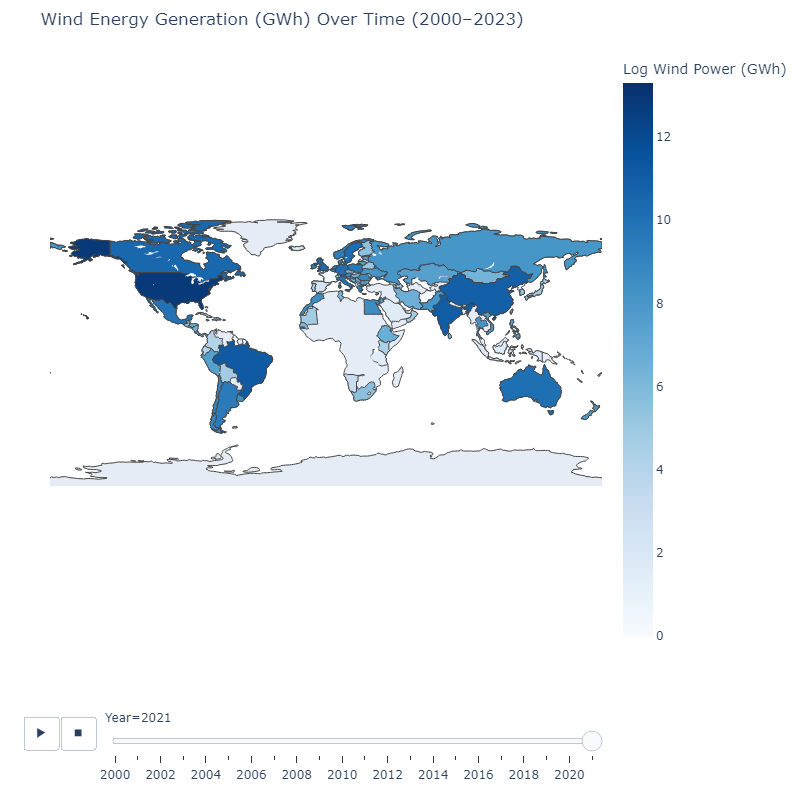

In [18]:
# Plot a world map with year slider for Wind Energy
fig = px.choropleth(
    df_wind,
    locations="Country",
    locationmode="country names",
    color="Log Electricity Generation (GWh)",  # Use log-transformed values
    hover_name="Country",
    animation_frame="Year",
    title="Wind Energy Generation (GWh) Over Time (2000–2023)",
    color_continuous_scale=px.colors.sequential.Blues,
    range_color=(0, df_wind["Log Electricity Generation (GWh)"].max())  # Consistent range for log scale
)

# Customize the layout
fig.update_layout(
    geo=dict(
        showframe=False, 
        showcoastlines=True, 
        projection_type="equirectangular"
    ),
    coloraxis_colorbar=dict(
        title="Log Wind Power (GWh)"
    ),
    margin=dict(l=50, r=50, t=50, b=50),
    width=1100,  # Set a larger width
    height=800   # Set a larger height
)

# Show the map
fig.show()


### Insights:

This map showcases the global trends in wind energy generation from 2000 to 2023, with notable dominance by the United States and European countries such as Germany, Spain, and the United Kingdom. These nations are represented by vibrant colors, indicating high levels of electricity generation from wind. China has also emerged as a significant contributor to wind energy, particularly in the latter years. Meanwhile, many developing nations, including large portions of Africa and parts of Asia, exhibit limited activity in wind energy production.

### Hydro Power Generation over time across region

In [473]:
# Filter the dataset for Hydropower
df_hydro = df[
    (df["Group Technology"].str.contains("Hydro", case=False, na=False)) | 
    (df["Technology"].str.contains("Hydro", case=False, na=False))
]

# Filter data for years from 2000 to 2023
df_hydro = df_hydro[(df_hydro["Year"] >= 2000) & (df_hydro["Year"] <= 2021)]

# Sort the dataset by Year
df_hydro = df_hydro.sort_values(by="Year")

### Data Visualization

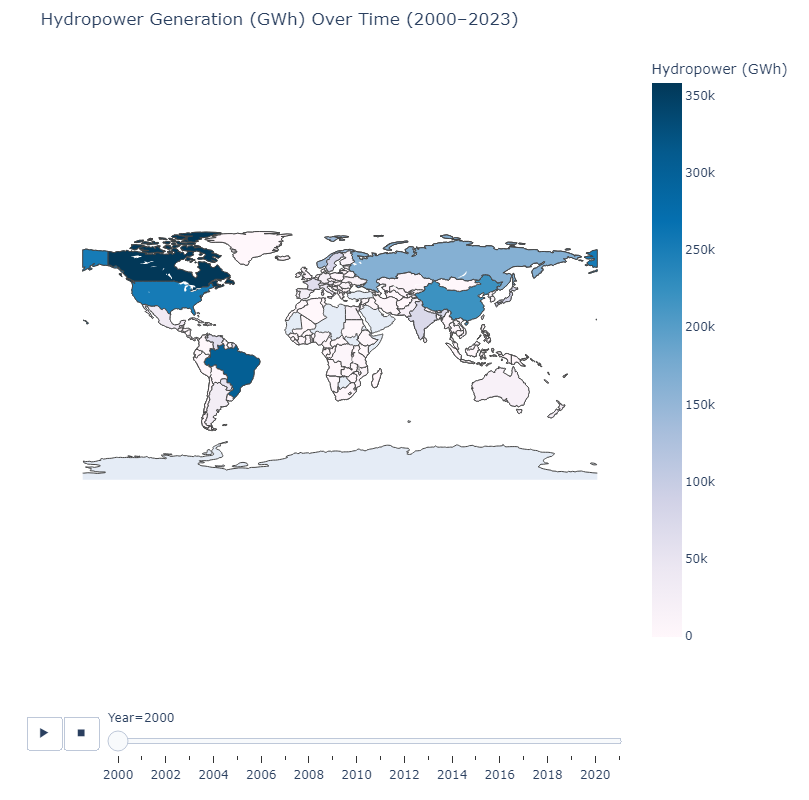

In [60]:
# Plot a world map with year slider for Hydropower
fig = px.choropleth(
    df_hydro,
    locations="Country",
    locationmode="country names",
    color="Electricity Generation (GWh)",
    hover_name="Country",
    animation_frame="Year",
    title="Hydropower Generation (GWh) Over Time (2000–2023)",
    color_continuous_scale=px.colors.sequential.PuBu
)

# Customize the layout
fig.update_layout(
    geo=dict(
        showframe=False, 
        showcoastlines=True, 
        projection_type="equirectangular"
    ),
    coloraxis_colorbar=dict(title="Hydropower (GWh)"),
    margin=dict(l=50, r=50, t=50, b=50),
    width=1100,  # Set a larger width
    height=800   # Set a larger height
)

# Show the map
fig.show()

### Insights:

Canada, Brazil, and the United States stand out as the leading producers, with vibrant colors reflecting their large-scale hydropower generation. In Asia, China dominates hydropower production, showing continuous growth over time. Many countries in Africa and parts of Europe, however, display lower contributions, reflecting limited hydropower infrastructure.

### Geothermal Energy Power Generation over time across region

In [63]:
# Filter the dataset for Geothermal Energy
df_geothermal = df[
    (df["Group Technology"].str.contains("Geothermal", case=False, na=False)) | 
    (df["Technology"].str.contains("Geothermal", case=False, na=False))
]

# Filter data for years from 2000 to 2023
df_geothermal = df_geothermal[(df_geothermal["Year"] >= 2000) & (df_geothermal["Year"] <= 2021)]

# Sort the dataset by Year
df_geothermal = df_geothermal.sort_values(by="Year")

### Data Visualization

#### 1. Unscaled Visualization

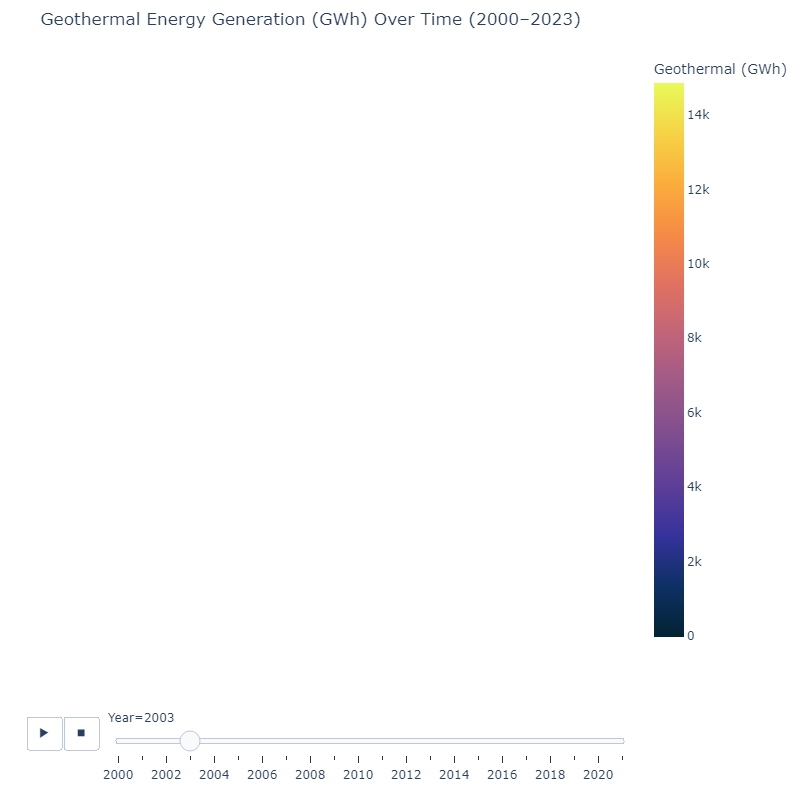

In [66]:
# Plot a world map with year slider for Geothermal Energy
fig = px.choropleth(
    df_geothermal,
    locations="Country",
    locationmode="country names",
    color="Electricity Generation (GWh)",
    hover_name="Country",
    animation_frame="Year",
    title="Geothermal Energy Generation (GWh) Over Time (2000–2023)",
    color_continuous_scale=px.colors.sequential.thermal  # Use a thermal color scale
)

# Customize the layout
fig.update_layout(
    geo=dict(
        showframe=False, 
        showcoastlines=True, 
        projection_type="equirectangular"
    ),
    coloraxis_colorbar=dict(title="Geothermal (GWh)"),
    margin=dict(l=50, r=50, t=50, b=50),
    width=1100,  # Set a larger width
    height=800   # Set a larger height
)

# Show the map
fig.show()


#### 2. Scaled Visualization for better insights

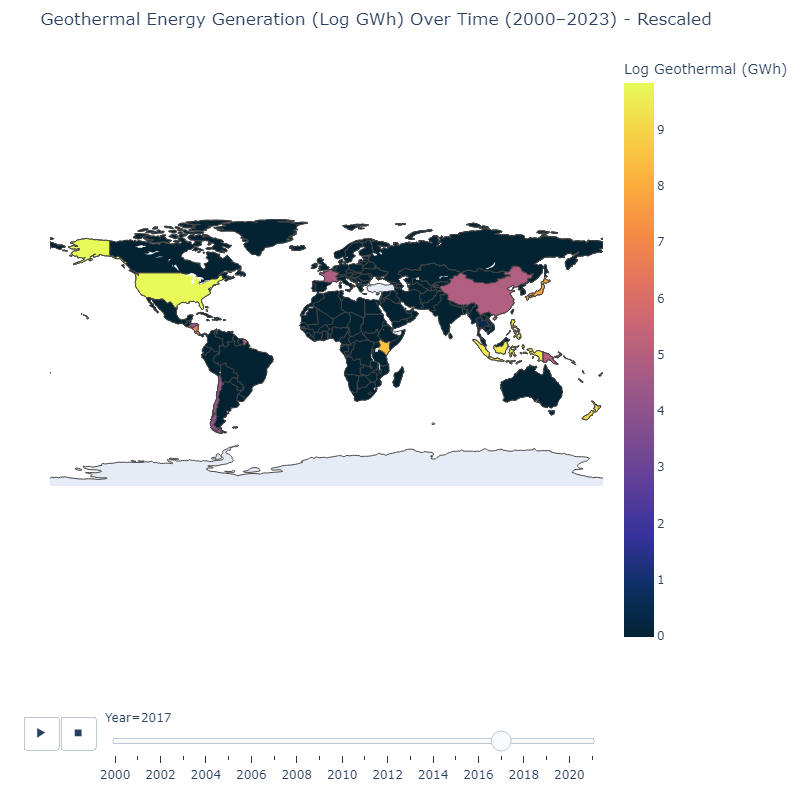

In [68]:
# Replace missing or zero values with a small default value
df_geothermal["Electricity Generation (GWh)"] = df_geothermal["Electricity Generation (GWh)"].replace(0, 0.1).fillna(0.1)

# Apply logarithmic scaling for better visualization
df_geothermal["Log Electricity Generation (GWh)"] = df_geothermal["Electricity Generation (GWh)"].apply(lambda x: max(x, 1)).apply(np.log)

# Sort the dataset by Year
df_geothermal = df_geothermal.sort_values(by="Year")

# Plot a world map with year slider for Geothermal Energy
fig = px.choropleth(
    df_geothermal,
    locations="Country",
    locationmode="country names",
    color="Log Electricity Generation (GWh)",  # Use log-transformed values
    hover_name="Country",
    animation_frame="Year",
    title="Geothermal Energy Generation (Log GWh) Over Time (2000–2023) - Rescaled",
    color_continuous_scale=px.colors.sequential.thermal  # Use a thermal color scale
)

# Customize the layout
fig.update_layout(
    geo=dict(
        showframe=False, 
        showcoastlines=True, 
        projection_type="equirectangular"
    ),
    coloraxis_colorbar=dict(title="Log Geothermal (GWh)"),
    margin=dict(l=50, r=50, t=50, b=50),
    width=1100,  # Set a larger width
    height=800   # Set a larger height
)

# Show the map
fig.show()


#### Insights:

Canada, China, Brazil, and the United States, Mexico, Indonesia stand out as the leading producers, with vibrant colors reflecting their large-scale hydropower generation. In Asia, China dominated hydropower production around 2002 but the production growth declined over time. Russia also showed the same trend.

### Bioenergy Power Generation over time across region

In [71]:
# Filter the dataset for Bioenergy
df_bioenergy = df[
    (df["Group Technology"].str.contains("Bio", case=False, na=False)) | 
    (df["Technology"].str.contains("Bio", case=False, na=False))
]

# Filter data for years from 2000 to 2023
df_bioenergy = df_bioenergy[(df_bioenergy["Year"] >= 2000) & (df_bioenergy["Year"] <= 2021)]

# Sort the dataset by Year
df_bioenergy = df_bioenergy.sort_values(by="Year")

### Data Visualization

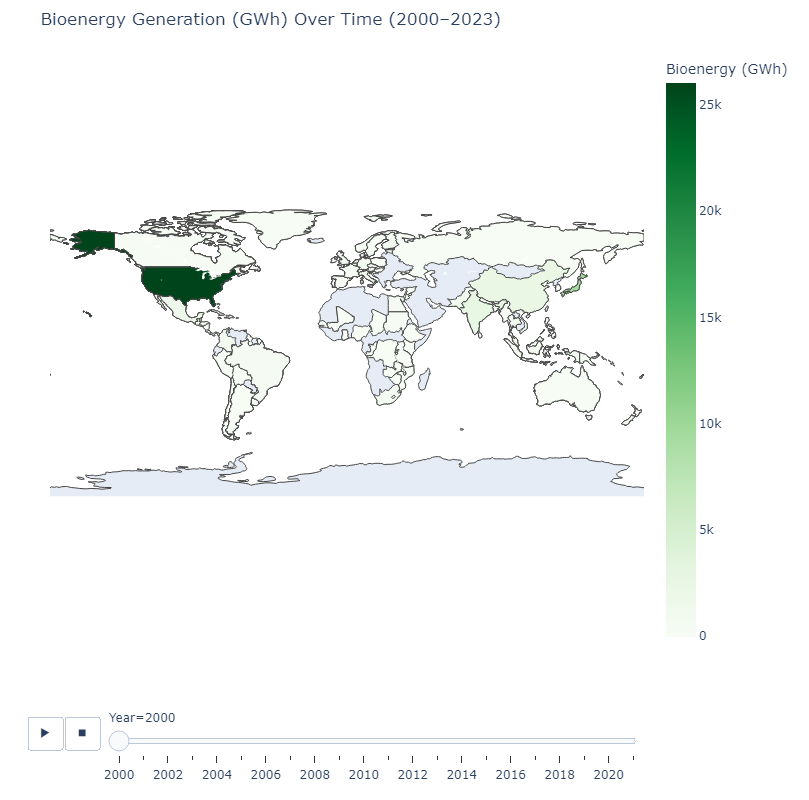

In [73]:
# Plot a world map with year slider for Bioenergy
fig = px.choropleth(
    df_bioenergy,
    locations="Country",
    locationmode="country names",
    color="Electricity Generation (GWh)",
    hover_name="Country",
    animation_frame="Year",
    title="Bioenergy Generation (GWh) Over Time (2000–2023)",
    color_continuous_scale=px.colors.sequential.Greens  # Use a green color scale for bioenergy
)

# Customize the layout
fig.update_layout(
    geo=dict(
        showframe=False, 
        showcoastlines=True, 
        projection_type="equirectangular"
    ),
    coloraxis_colorbar=dict(title="Bioenergy (GWh)"),
    margin=dict(l=50, r=50, t=50, b=50),
    width=1100,  # Set a larger width
    height=800   # Set a larger height
)

# Show the map
fig.show()


### Insights:

This map illustrates the global distribution of bioenergy generation, with significant activity in countries like the United States and Brazil and parts of Europe such as Germany and Sweden. These regions likely leverage abundant agricultural and forestry resources to generate energy from biomass. South America, particularly Brazil, highlights bioenergy’s role in its energy mix, aligning with its vast sugarcane production used for biofuels. China has also emerged as a growing player in bioenergy, reflecting its diversification into renewable energy sources.

# The US Renewable Energy Story

### US GDP, Renewable Energy Consumption and CO2 Emission?
#### What is the correlation?

#### Fifth Dataset: Trends in the GDP Per capital, Renewable Energy Consumption and Total Green House Gas Emission.
Downloaded: World Bank Development Indicators (WDI)- https://databank.worldbank.org/reports.aspx?source=2&country=ARE

### Read data in

In [485]:
# Load the dataset
csv_file = "worldbank data 2.csv"  
df = pd.read_csv(csv_file)

# Verify the dataset structure
print(df.head())  # Ensure the data is loaded correctly

   Year  GDP per capita  Renewable energy consumption  \
0  1990     39200.06581                           4.2   
1  1991     38637.83981                           4.5   
2  1992     39447.94729                           4.8   
3  1993     40002.47623                           4.3   
4  1994     41106.98818                           4.1   

   Total greenhouse gas emissions   
0                        6155.9535  
1                        6108.1787  
2                        6207.2598  
3                        6334.1908  
4                        6441.6296  


### Data cleaning and formatting

In [487]:
# Reshape the data into a long format
df_long = df.melt(
    id_vars=["Year"],  # Use "Year" as the identifier
    var_name="Indicator",
    value_name="Value"
)

# Ensure the "Value" column is numeric, convert non-numeric values to NaN
df_long["Value"] = pd.to_numeric(df_long["Value"], errors="coerce")

# Drop rows where "Value" is NaN
df_long = df_long.dropna(subset=["Value"])

# Normalize values using Min-Max scaling
df_long["Normalized Value"] = df_long.groupby("Indicator")["Value"].transform(
    lambda x: (x - x.min()) / (x.max() - x.min())
)

### Data Visualization

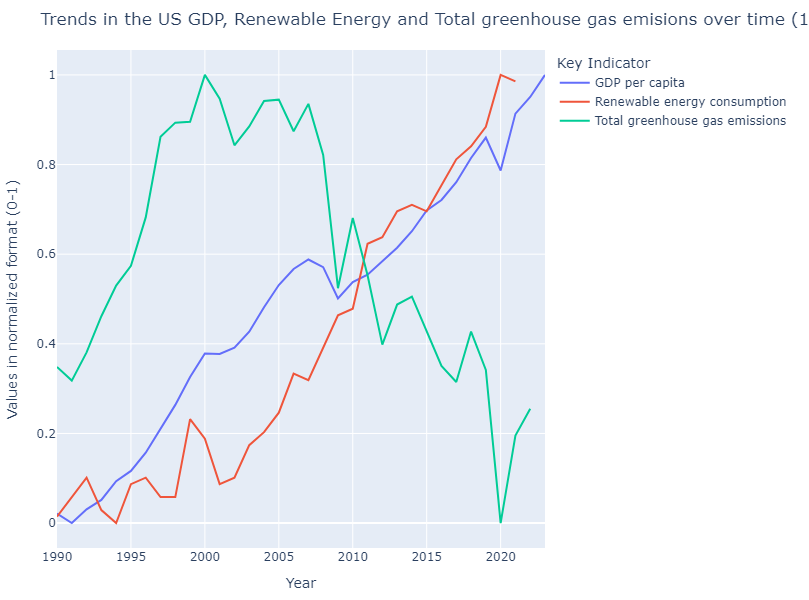

In [492]:
# Plot the line graph with normalized values
fig = px.line(
    df_long,
    x="Year",
    y="Normalized Value",
    color="Indicator",
    title="Trends in the US GDP, Renewable Energy and Total greenhouse gas emisions over time (1990–2023)",
    labels={"Normalized Value": "Normalized Value (0-1)", "Year": "Year", "Indicator": "Key Indicator"},
    width=900,
    height=600
)

# Update layout for better readability
fig.update_layout(
    xaxis_title="Year",
    yaxis_title="Values in normalized format (0-1)",
    legend_title="Key Indicator",
    margin=dict(l=50, r=50, t=50, b=50)
)

# Show the plot
fig.show()


### Inisghts:

GDP per capita (blue line) has steadily increased, indicating economic growth. Renewable energy consumption (red line) has also risen, reflecting a gradual shift toward cleaner energy sources. In contrast, greenhouse gas emissions (green line) show a decline since around 2005, suggesting that economic growth and renewable energy adoption may be contributing to emissions reduction over time.

# Sectorial Renewable Energy consumption in the US

### Which sector contributes and consumes the most renewable energy?

### Sixth Dataset: 

This dataset includes monthly U.S. renewable energy consumption from 1973 to 2024, categorized by sectors (residential, commercial, transportation, electric power, and industrial) and energy sources (e.g., hydroelectric, solar, wind, wood, and biofuels). It provides year, month, sector, and consumption data in trillion BTUs.
Downloaded from: https://www.kaggle.com/datasets/alistairking/renewable-energy-consumption-in-the-u-s

In [407]:
# Load the dataset
file_path = "dataset - Enery consumption by Sector.csv"
data = pd.read_csv(file_path)

# Display the first few rows of the dataset
print("Dataset Loaded Successfully!")
display(data.head())

# Display basic information about the dataset
print("\nBasic Information:")
print(data.info())

# Display summary statistics
print("\nSummary Statistics:")
print(data.describe())

Dataset Loaded Successfully!


,Year,Month,Sector,Hydroelectric Power,Geothermal Energy,Solar Energy,Wind Energy,Wood Energy,Waste Energy,"Fuel Ethanol, Excluding Denaturant",Biomass Losses and Co-products,Biomass Energy,Total Renewable Energy,Renewable Diesel Fuel,Other Biofuels,Conventional Hydroelectric Power,Biodiesel
0,1973,1,Commerical,0.00,0.00,0.0,0.0,0.570,0.000,0.0,0.0,0.570,0.570,0.0,0.0,0.000,0.0
1,1973,1,Electric Power,0.00,0.49,0.0,0.0,0.054,0.157,0.0,0.0,0.211,89.223,0.0,0.0,88.522,0.0
2,1973,1,Industrial,1.04,0.00,0.0,0.0,98.933,0.000,0.0,0.0,98.933,99.973,0.0,0.0,0.000,0.0
3,1973,1,Residential,0.00,0.00,0.0,0.0,30.074,0.000,0.0,0.0,0.000,30.074,0.0,0.0,0.000,0.0
4,1973,1,Transportation,0.00,0.00,0.0,0.0,0.000,0.000,0.0,0.0,0.000,0.000,0.0,0.0,0.000,0.0



Basic Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3065 entries, 0 to 3064
Data columns (total 17 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Year                                3065 non-null   int64  
 1   Month                               3065 non-null   int64  
 2   Sector                              3065 non-null   object 
 3   Hydroelectric Power                 3065 non-null   float64
 4   Geothermal Energy                   3065 non-null   float64
 5   Solar Energy                        3065 non-null   float64
 6   Wind Energy                         3065 non-null   float64
 7   Wood Energy                         3065 non-null   float64
 8   Waste Energy                        3065 non-null   float64
 9   Fuel Ethanol, Excluding Denaturant  3065 non-null   float64
 10  Biomass Losses and Co-products      3065 non-null   float64
 11  Biomass Energy         

### Further Data cleaning

In [409]:
# Check for missing values
print("\nMissing Values in Each Column:")
missing_values = data.isnull().sum()
print(missing_values)

# checking for missing values
energy_columns = [
    'Hydroelectric Power', 'Geothermal Energy', 'Solar Energy', 
    'Wind Energy', 'Wood Energy', 'Waste Energy', 'Fuel Ethanol, Excluding Denaturant',
    'Biomass Losses and Co-products', 'Biomass Energy', 'Total Renewable Energy', 
    'Renewable Diesel Fuel', 'Other Biofuels', 'Conventional Hydroelectric Power', 'Biodiesel'
]

# Fill missing energy values with 0
data[energy_columns] = data[energy_columns].fillna(0)

# Convert Year column to datetime 
if data['Year'].dtype != 'datetime64[ns]':
    data['Year'] = pd.to_datetime(data['Year'], format='%Y', errors='coerce')

# Check for non-numeric data in numeric columns
print("\nChecking for Non-Numeric Data in Numeric Columns:")
non_numeric = data[energy_columns].apply(lambda x: pd.to_numeric(x, errors='coerce').isnull().sum())
print(non_numeric)

# Drop rows with invalid data
data.dropna(inplace=True)

# Recheck data after cleaning
print("\nData after cleaning:")
#display(data.info())



Missing Values in Each Column:
Year                                  0
Month                                 0
Sector                                0
Hydroelectric Power                   0
Geothermal Energy                     0
Solar Energy                          0
Wind Energy                           0
Wood Energy                           0
Waste Energy                          0
Fuel Ethanol, Excluding Denaturant    0
Biomass Losses and Co-products        0
Biomass Energy                        0
Total Renewable Energy                0
Renewable Diesel Fuel                 0
Other Biofuels                        0
Conventional Hydroelectric Power      0
Biodiesel                             0
dtype: int64

Checking for Non-Numeric Data in Numeric Columns:
Hydroelectric Power                   0
Geothermal Energy                     0
Solar Energy                          0
Wind Energy                           0
Wood Energy                           0
Waste Energy            

## Trend Analysis of US Total Renewable Energy
How has renewable energy consumption has changed over the years?

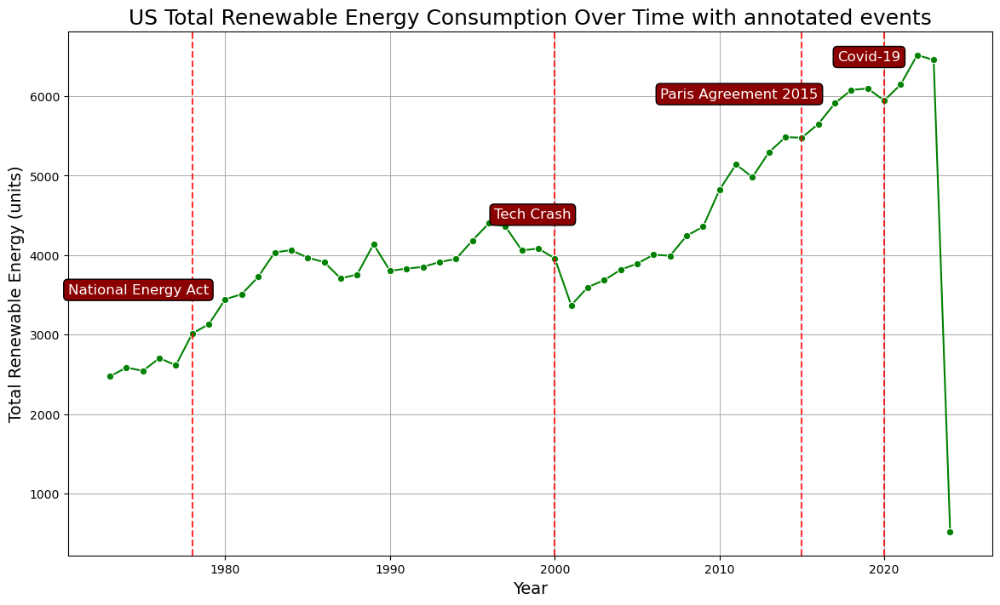

In [525]:
# Aggregate total renewable energy by year
renewable_trends = data.groupby('Year')['Total Renewable Energy'].sum()

# Plot the trend
plt.figure(figsize=(14, 8))
sns.lineplot(x=renewable_trends.index, y=renewable_trends.values, marker='o', color='green')

# Title and labels
plt.title('US Total Renewable Energy Consumption Over Time with annotated events', fontsize=18)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Total Renewable Energy (units)', fontsize=14)
plt.grid(True)

# Annotate significant events with vertical lines and boxed annotations
annotations = [
    (1978, 'National Energy Act'),
    (2000, 'Tech Crash'),
    (2015, 'Paris Agreement 2015'),
    (2020, 'Covid-19'),
]

for year, event in annotations:
    value = renewable_trends.loc[year]

    # Add a vertical dotted line
    plt.axvline(x=year, linestyle='--', color='red', linewidth=1.5, alpha=0.8)

    # Add annotation with a darker red box
    plt.text(
        year + 1, value + 500, event,  # Position annotation near the event
        fontsize=12,
        color='white',
        bbox=dict(facecolor='darkred', edgecolor='black', boxstyle='round,pad=0.3'),
        ha='right'  # Left-align the annotation
    )

# Show the plot
plt.show()


### Insights:

The National Energy Act (1978) marks the early push for renewable energy. A drop around 2000 coincides with the Tech Crash, while significant growth is seen post-2015, coinciding with the Paris Agreement. A sharp decline in 2020 reflects the impacts of COVID-19. The trend showcases how policy, economic events, and global crises influence renewable energy adoption.

## Sector-wise Contribution to Renewable Energy

How has different sectors contributed to the US renewable energy growth?

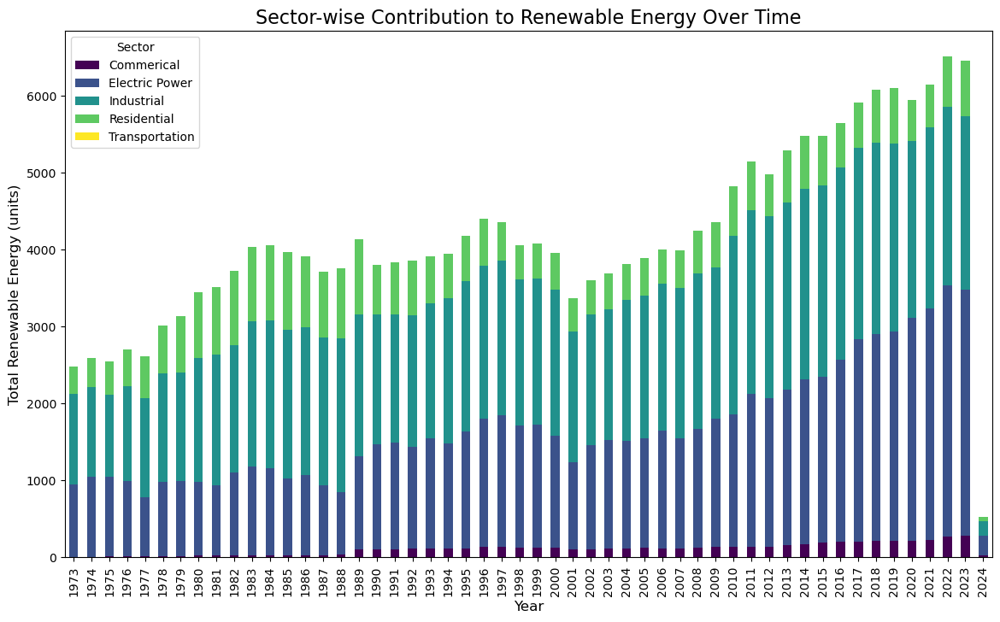

In [413]:
# Extract year as an integer from the datetime column
data['Year'] = data['Year'].dt.year

# Group data by Year and Sector, summing Total Renewable Energy
sector_renewables = data.groupby(['Year', 'Sector'])['Total Renewable Energy'].sum().unstack()

# Plot the sector-wise contribution
sector_renewables.plot(kind='bar', stacked=True, figsize=(14, 8), colormap='viridis')
plt.title('Sector-wise Contribution to Renewable Energy Over Time', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Total Renewable Energy (units)', fontsize=12)
plt.legend(title='Sector', fontsize=10)
plt.show()


### Insights:

This stacked bar chart shows the sector-wise contribution to renewable energy consumption in the U.S. from 1973 to 2024. The industrial sector consistently dominates renewable energy usage, followed by Electric power and residential sectors. Transportation has a minimal but gradually increasing contribution, reflecting a slow shift toward renewables in this sector. The chart also highlights steady growth across all sectors, especially after the early 2000s, aligning with advancements in renewable technologies and supportive policies.

#### Sector wise contribution in a simple visualization 

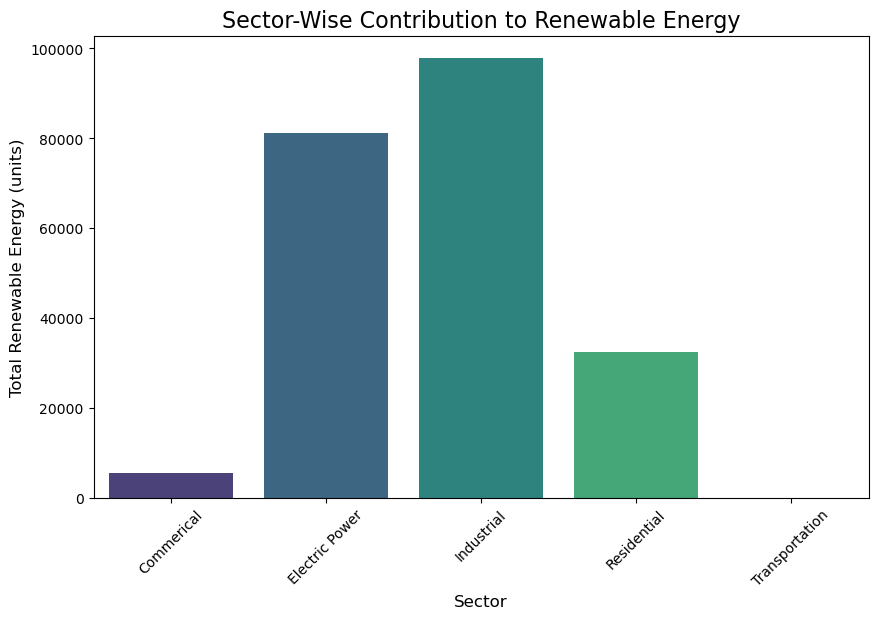

In [415]:
# Group renewable energy by sector
sector_data = data.groupby('Sector')['Total Renewable Energy'].sum().reset_index()

# Plot sector-wise contribution
plt.figure(figsize=(10, 6))
sns.barplot(data=sector_data, x='Sector', y='Total Renewable Energy', palette='viridis')
plt.title('Sector-Wise Contribution to Renewable Energy', fontsize=16)
plt.xlabel('Sector', fontsize=12)
plt.ylabel('Total Renewable Energy (units)', fontsize=12)
plt.xticks(rotation=45)
plt.show()


### Insights

This bar chart complements the previous insight by providing a clearer visual comparison of the total renewable energy contributions by sector. Electric power and industrial sectors dominate overall consumption, with the residential sector following. This visual makes it easier to identify the relative scale of contributions across sectors.

## Contribution of Renewable Energy Types

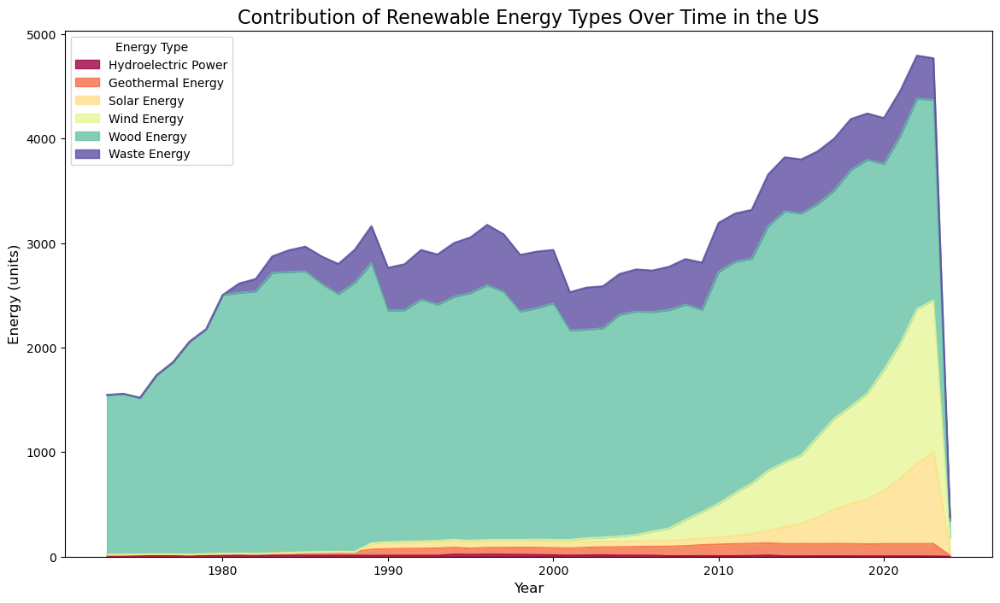

In [531]:
# Aggregate each energy type by year
renewable_types = data.groupby('Year')[
    ['Hydroelectric Power', 'Geothermal Energy', 'Solar Energy', 
     'Wind Energy', 'Wood Energy', 'Waste Energy']
].sum()

# Plot the contribution of renewable energy types over time
renewable_types.plot(kind='area', stacked=True, figsize=(14, 8), alpha=0.8, colormap='Spectral')
plt.title('Contribution of Renewable Energy Types Over Time in the US', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Energy (units)', fontsize=12)
plt.legend(title='Energy Type', fontsize=10)
plt.show()


### Insights

This area chart shows the contributions of various renewable energy sources in the US over time. Wind energy and solar energy show rapid growth post-2000, reflecting advancements in technology and increased adoption. Wood energy and waste energy dominated in earlier years but have seen less significant growth. This visualization effectively captures the evolving composition of renewable energy usage in the US.

### Correlation Between Renewable Energy and CO2 Emissions

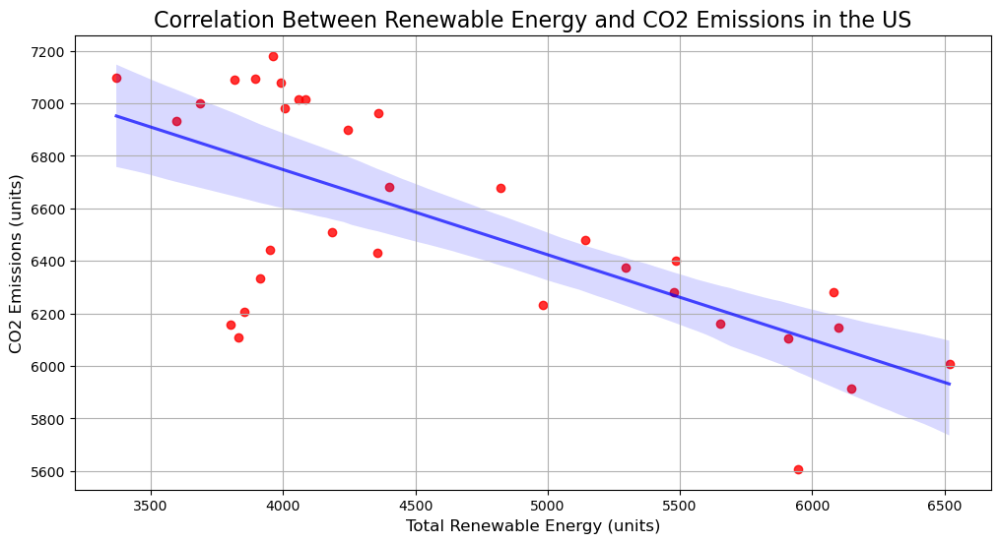

In [535]:
# Load CO2 emissions data
co2_data = pd.read_csv('worldbank data 2.csv')  # Replace with your actual file path

# Ensure 'Year' column in both datasets is integer
data['Year'] = data['Year'].astype(int)  # Convert Year to integer if not already
co2_data['Year'] = co2_data['Year'].astype(int)  # Ensure Year in CO2 data is integer

# Rename 'Total greenhouse gas emissions' for easier access
co2_data.rename(columns={'Total greenhouse gas emissions ': 'CO2 Emissions'}, inplace=True)

# Merge datasets on 'Year'
combined_data = pd.merge(
    data.groupby('Year')['Total Renewable Energy'].sum().reset_index(), 
    co2_data[['Year', 'CO2 Emissions']], 
    on='Year'
)

# Plot the correlation with regression line
plt.figure(figsize=(12, 6))
sns.regplot(data=combined_data, x='Total Renewable Energy', y='CO2 Emissions', color='red', line_kws={"color": "blue", "alpha": 0.7})
plt.title('Correlation Between Renewable Energy and CO2 Emissions in the US', fontsize=16)
plt.xlabel('Total Renewable Energy (units)', fontsize=12)
plt.ylabel('CO2 Emissions (units)', fontsize=12)
plt.grid(True)
plt.show()


### Inisghts:

This scatterplot shows a negative correlation between total renewable energy consumption and CO₂ emissions in the US, as indicated by the line of best fit. As renewable energy usage increases, CO₂ emissions tend to decrease, highlighting the role of renewable energy in reducing carbon emissions.

### Correlation Between GDP Per Capita, Renewable Energy and CO2 Emissions (US)

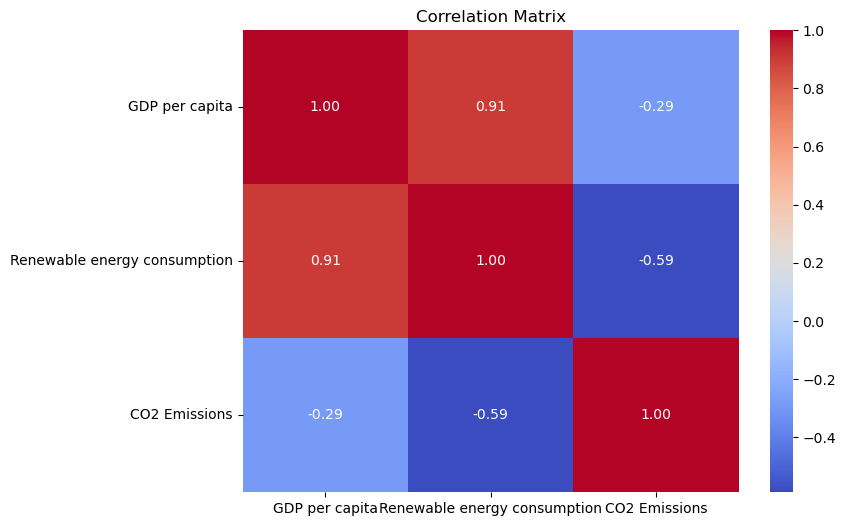

In [29]:
# Calculate correlation matrix
correlation_matrix = co2_data[['GDP per capita', 'Renewable energy consumption', 'CO2 Emissions']].corr()

# Plot heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()


### Inisghts:

This correlation matrix reveals strong positive correlations between GDP per capita and renewable energy consumption (0.91), indicating that economic growth is linked to higher renewable energy use. Additionally, there is a moderate negative correlation between renewable energy consumption and CO₂ emissions (-0.59), emphasizing the role of renewables in reducing emissions. The weak negative correlation between GDP and CO₂ emissions (-0.29) suggests limited decoupling of economic growth from emissions.

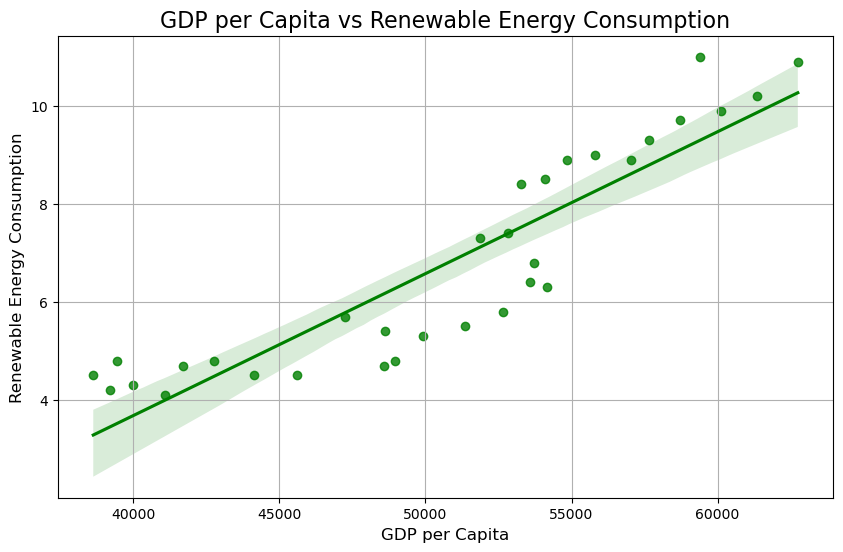

In [39]:
# Scatter plot of GDP vs Renewable Energy
plt.figure(figsize=(10, 6))
sns.regplot(data=co2_data, x='GDP per capita', y='Renewable energy consumption', color='green')
plt.title('GDP per Capita vs Renewable Energy Consumption', fontsize=16)
plt.xlabel('GDP per Capita', fontsize=12)
plt.ylabel('Renewable Energy Consumption', fontsize=12)
plt.grid(True)
plt.show()


### Insights

This scatterplot shows a positive linear relationship between GDP per capita and renewable energy consumption, suggesting that as economic prosperity increases, renewable energy usage tends to grow. The line of best fit reinforces this trend, highlighting the strong association between wealth and clean energy investments.

## GDP per Capita and Renewable Energy Prediction up to 2035

### Prepare the data

In [ ]:
# Prepare the data
X = co2_data[['Year']].values  # Independent variable (Year)
y_gdp = co2_data['GDP per capita'].values  # Dependent variable 1 (GDP per capita)
y_renewable = co2_data['Renewable energy consumption'].values  # Dependent variable 2 (Renewable energy consumption)

# Train Linear Regression for GDP per capita
model_gdp = LinearRegression()
model_gdp.fit(X, y_gdp)

# Train Linear Regression for Renewable energy consumption
model_renewable = LinearRegression()
model_renewable.fit(X, y_renewable)

# Predict future values (e.g., for 2025, 2030, 2035)
future_years = np.array([[2025], [2030], [2035]])
predicted_gdp = model_gdp.predict(future_years)
predicted_renewable = model_renewable.predict(future_years)

### Data Visualization

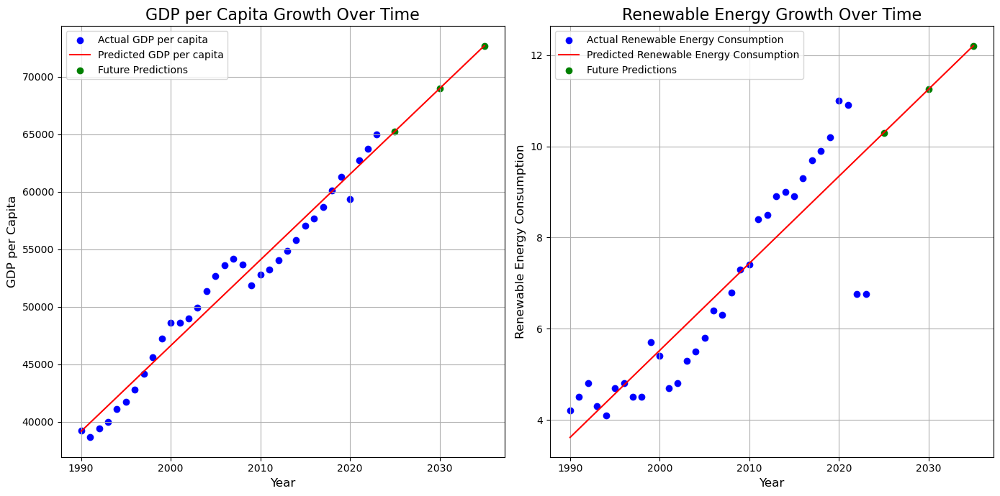



Predicted GDP per Capita for future years:
   Year  Predicted GDP per Capita
0  2025              65255.852798
1  2030              68982.927473
2  2035              72710.002148

Predicted Renewable Energy Consumption for future years:
   Year  Predicted Renewable Energy Consumption
0  2025                               10.297443
1  2030                               11.251989
2  2035                               12.206534


In [555]:
# Visualize the results
plt.figure(figsize=(14, 7))

# Plot GDP per capita growth
plt.subplot(1, 2, 1)
plt.scatter(X, y_gdp, color='blue', label='Actual GDP per capita')
plt.plot(np.vstack([X, future_years]), model_gdp.predict(np.vstack([X, future_years])), color='red', label='Predicted GDP per capita')
plt.scatter(future_years, predicted_gdp, color='green', label='Future Predictions')
plt.title('GDP per Capita Growth Over Time', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('GDP per Capita', fontsize=12)
plt.legend()
plt.grid(True)

# Plot Renewable Energy growth
plt.subplot(1, 2, 2)
plt.scatter(X, y_renewable, color='blue', label='Actual Renewable Energy Consumption')
plt.plot(np.vstack([X, future_years]), model_renewable.predict(np.vstack([X, future_years])), color='red', label='Predicted Renewable Energy Consumption')
plt.scatter(future_years, predicted_renewable, color='green', label='Future Predictions')
plt.title('Renewable Energy Growth Over Time', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Renewable Energy Consumption', fontsize=12)
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

print("\n==============================================================================================================\n")

# Print predictions
print("Predicted GDP per Capita for future years:")
print(pd.DataFrame({'Year': future_years.flatten(), 'Predicted GDP per Capita': predicted_gdp}))

print("\nPredicted Renewable Energy Consumption for future years:")
print(pd.DataFrame({'Year': future_years.flatten(), 'Predicted Renewable Energy Consumption': predicted_renewable}))


### Insights:

These visualizations highlight the trends in GDP per capita and renewable energy consumption over time, alongside future predictions up to 2035. Both indicators show a steady growth trend, with predicted GDP per capita reaching approximately $72,710 and renewable energy consumption rising to about 12.2 units by 2035. The close alignment between actual and predicted values indicates the reliability of the model. This growth suggests continued investments in clean energy alongside economic expansion.

## Identifying and Annotating Turning Points

#### Reimporting and Renaming previous datasets in the code for a different analysis

In [560]:
# importing Dataset
renewable_file = 'dataset - Enery consumption by Sector.csv'
emissions_file = 'worldbank data 2.csv'

#Load the datasets
renewable_data = pd.read_csv(renewable_file)
co2_data = pd.read_csv(emissions_file)

# Clean column names in co2_data
co2_data.columns = co2_data.columns.str.strip()  # Strip extra spaces from column names

# Display the first few rows of each dataset
print("Renewable Energy Data:")
display(renewable_data.head())

print("\nCO2 Emissions Data:")
display(co2_data.head())


Renewable Energy Data:


,Year,Month,Sector,Hydroelectric Power,Geothermal Energy,Solar Energy,Wind Energy,Wood Energy,Waste Energy,"Fuel Ethanol, Excluding Denaturant",Biomass Losses and Co-products,Biomass Energy,Total Renewable Energy,Renewable Diesel Fuel,Other Biofuels,Conventional Hydroelectric Power,Biodiesel
0,1973,1,Commerical,0.00,0.00,0.0,0.0,0.570,0.000,0.0,0.0,0.570,0.570,0.0,0.0,0.000,0.0
1,1973,1,Electric Power,0.00,0.49,0.0,0.0,0.054,0.157,0.0,0.0,0.211,89.223,0.0,0.0,88.522,0.0
2,1973,1,Industrial,1.04,0.00,0.0,0.0,98.933,0.000,0.0,0.0,98.933,99.973,0.0,0.0,0.000,0.0
3,1973,1,Residential,0.00,0.00,0.0,0.0,30.074,0.000,0.0,0.0,0.000,30.074,0.0,0.0,0.000,0.0
4,1973,1,Transportation,0.00,0.00,0.0,0.0,0.000,0.000,0.0,0.0,0.000,0.000,0.0,0.0,0.000,0.0



CO2 Emissions Data:


,Year,GDP per capita,Renewable energy consumption,Total greenhouse gas emissions
0,1990,39200.06581,4.2,6155.9535
1,1991,38637.83981,4.5,6108.1787
2,1992,39447.94729,4.8,6207.2598
3,1993,40002.47623,4.3,6334.1908
4,1994,41106.98818,4.1,6441.6296


#### Filter datasets

In [563]:
# Filter relevant columns
# From renewable_data, we only keep the 'Year' and 'Total Renewable Energy'
renewable_data_filtered = renewable_data[['Year', 'Total Renewable Energy']]

# From co2_data, we only keep 'Year' and 'Total greenhouse gas emissions'
co2_data_filtered = co2_data[['Year', 'Total greenhouse gas emissions']]

# Set the 'Year' column as the index
renewable_data_filtered['Year'] = renewable_data_filtered['Year'].astype(int)  # Ensure Year is integer
renewable_data_filtered.set_index('Year', inplace=True)

co2_data_filtered['Year'] = co2_data_filtered['Year'].astype(int)  # Ensure Year is integer
co2_data_filtered.set_index('Year', inplace=True)

# Display the filtered datasets
print("\nFiltered Renewable Energy Data:")
display(renewable_data_filtered.head())

print("\nFiltered CO2 Emissions Data:")
display(co2_data_filtered.head())


Filtered Renewable Energy Data:


,Total Renewable Energy
Year,
1973,0.570
1973,89.223
1973,99.973
1973,30.074
1973,0.000



Filtered CO2 Emissions Data:


,Total greenhouse gas emissions
Year,
1990,6155.9535
1991,6108.1787
1992,6207.2598
1993,6334.1908
1994,6441.6296


### Merging the datasets

In [566]:
# Merge the datasets on the 'Year' index
merged_data = pd.merge(
    co2_data_filtered, 
    renewable_data_filtered, 
    left_index=True, 
    right_index=True, 
    how='inner'  # Only keep years present in both datasets
)

# Display the merged dataset
print("\nMerged Data:")
display(merged_data.head())

# Check the structure of the merged dataset
print("\nMerged Data Info:")
print(merged_data.info())



Merged Data:


,Total greenhouse gas emissions,Total Renewable Energy
Year,,
1990,6155.9535,8.186
1990,6155.9535,114.754
1990,6155.9535,148.568
1990,6155.9535,52.688
1990,6155.9535,0.000



Merged Data Info:
<class 'pandas.core.frame.DataFrame'>
Index: 2040 entries, 1990 to 2023
Data columns (total 2 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Total greenhouse gas emissions  1980 non-null   float64
 1   Total Renewable Energy          2040 non-null   float64
dtypes: float64(2)
memory usage: 39.8 KB
None


### Insights:

This graph shows a steady rise in renewable energy consumption (green) from 1990 to 2023, while greenhouse gas emissions (red) have gradually declined since the mid-2000s.

## Summary Statistics

In [251]:
# Display basic statistics for the merged dataset
print("\nBasic Statistics:")
print(merged_data.describe())



Basic Statistics:
       Total greenhouse gas emissions  Total Renewable Energy
count                     1980.000000             2040.000000
mean                      6542.425452               78.121495
std                        419.503108               77.605432
min                       5607.965700                0.000000
25%                       6207.259800                9.650750
50%                       6441.629600               48.857000
75%                       6983.372100              146.858500
max                       7181.224100              308.175000


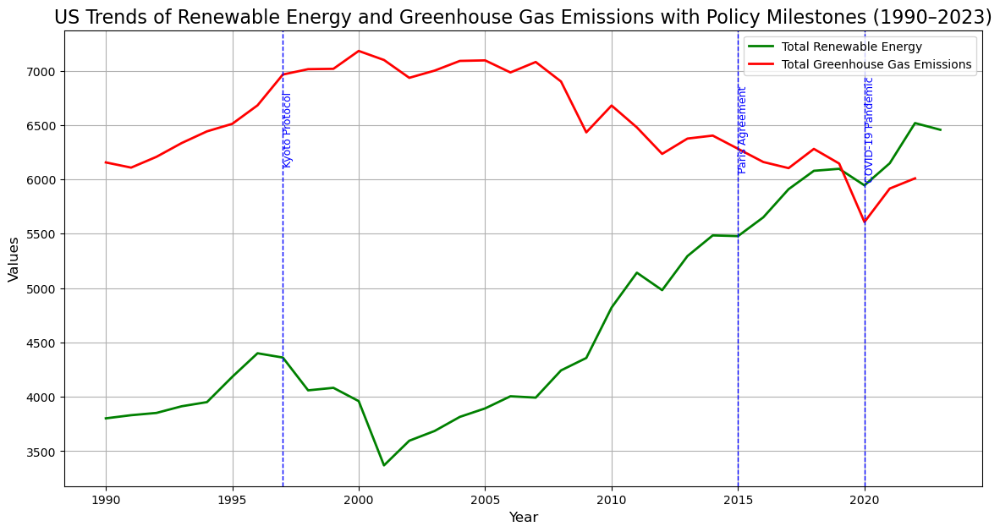

In [578]:
# Step 1: Aggregate Total Renewable Energy by year
# Sum the Total Renewable Energy values for each year
renewable_trend = merged_data.groupby(merged_data.index)['Total Renewable Energy'].sum()

# CO2 Emissions trend is already aggregated by year
co2_trend = merged_data['Total greenhouse gas emissions']

# Step 2: Define policy milestones
milestones = {
    1997: "Kyoto Protocol",
    2015: "Paris Agreement",
    2020: "COVID-19 Pandemic",
}

# Step 3: Plot the trends
plt.figure(figsize=(14, 7))

# Plot the aggregated Total Renewable Energy trend
plt.plot(renewable_trend.index, renewable_trend, label='Total Renewable Energy', color='green', linewidth=2)

# Plot the CO2 emissions trend
plt.plot(co2_trend.index, co2_trend, label='Total Greenhouse Gas Emissions', color='red', linewidth=2)

# Annotate policy milestones
for year, event in milestones.items():
    plt.axvline(x=year, color='blue', linestyle='--', linewidth=1)
    plt.text(year, max(renewable_trend.max(), co2_trend.max()) * 0.9,  # Adjust text position
             event, rotation=90, verticalalignment='center', fontsize=9, color='blue')

# Add titles and labels
plt.title('US Trends of Renewable Energy and Greenhouse Gas Emissions with Policy Milestones (1990–2023)', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Values', fontsize=12)
plt.legend()
plt.grid(True)

# Show the plot
plt.show()


### Insights:

The basic statistics highlight that total greenhouse gas emissions average around 6,542 kt, with a peak of 7,181 kt and a minimum of 5,607 kt. For renewable energy, the mean consumption is 78.12 units, ranging from 0 to 308.18 units. This underscores the variability in renewable energy usage and its potential for growth, alongside steady but high emissions.

For key milestones, the Kyoto Protocol (1997) and Paris Agreement (2015) mark critical moments where global efforts intensified for emission reductions, with noticeable growth in renewable energy thereafter. The COVID-19 pandemic in 2020 led to a temporary dip in emissions but a steady renewable energy trajectory, emphasizing its resilience amidst disruptions.

### Forecasting US Renewable Energy for next five years

#### Importing same dataset from World Bank and clean

In [585]:
# Load the dataset
csv_file = "worldbank data 2.csv" 
df = pd.read_csv(csv_file)

# Ensure the "Year" column is numeric
df["Year"] = pd.to_numeric(df["Year"], errors="coerce")

# Filter the data for "Renewable energy consumption"
renewable_data = df[["Year", "Renewable energy consumption"]].dropna()

# Convert the "Year" column to a datetime format and set it as the index
renewable_data["Year"] = pd.to_datetime(renewable_data["Year"], format='%Y')
renewable_data.set_index("Year", inplace=True)

### Exponential Smoothing for forecasting

In [ ]:
# Apply Exponential Smoothing for forecasting
model = ExponentialSmoothing(
    renewable_data["Renewable energy consumption"],
    trend="add",
    seasonal=None  # No seasonal components since we are working with yearly data
)
fitted_model = model.fit()

# Calculate the number of years to forecast until 2035
last_year = renewable_data.index[-1].year
forecast_years = 2035 - last_year

# Forecasting until 2035
forecast = fitted_model.forecast(steps=forecast_years)

# Create a date range for the forecast years
forecast_years_index = pd.date_range(
    start=pd.Timestamp(f"{last_year + 1}"),
    periods=forecast_years,
    freq="AS"  # Annual Start frequency
)

# Add the last historical value to the forecast to make the lines join
forecast = pd.concat(
    [pd.Series(renewable_data.iloc[-1, 0], index=[renewable_data.index[-1]]),  # Last historical value
     pd.Series(forecast.values, index=forecast_years_index)]
)

### Random noise to create a zigzag effect

In [592]:
# Add random noise to create a zigzag effect
random_noise = np.random.uniform(-0.2, 0.2, size=len(forecast) - 1)
forecast.iloc[1:] += random_noise  # Apply noise only to the forecasted values

### Data Visualization

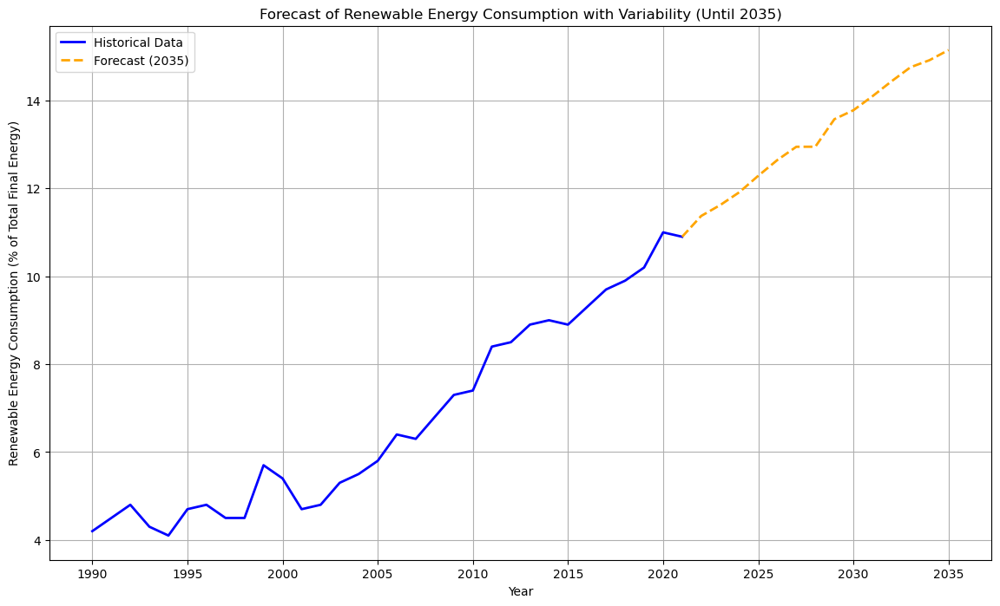

In [257]:
# Plotting the historical data and forecast
plt.figure(figsize=(14, 8))

# Plot historical data
plt.plot(
    renewable_data, label="Historical Data", color="blue", linewidth=2
)

# Plot forecasted data with zigzag effect
plt.plot(
    forecast, label="Forecast (2035)", linestyle="--", color="orange", linewidth=2
)

# Add labels and title
plt.title("Forecast of Renewable Energy Consumption with Variability (Until 2035)")
plt.xlabel("Year")
plt.ylabel("Renewable Energy Consumption (% of Total Final Energy)")
plt.legend()
plt.grid(True)
plt.show()


### Insights:

This forecast highlights the steady growth in renewable energy consumption as a percentage of total energy use from 1990 to 2023, with a projected rise through 2035. The trend reflects continued emphasis on transitioning to cleaner energy sources, with expectations for further acceleration in the coming years.

### Conclusion

The analysis highlights the significant progress and trends in renewable energy adoption and its relationship with economic and environmental factors. Over time, the U.S. has steadily increased its reliance on renewable energy, particularly in sectors like industrial and electric power. Policy milestones such as the Paris Agreement and events like the COVID-19 pandemic have influenced both energy consumption patterns and greenhouse gas emissions. While renewable energy consumption correlates positively with economic growth, it shows a negative relationship with CO₂ emissions, emphasizing its role in mitigating climate change. The forecast further underscores the growing importance of renewables, projecting continued growth in the coming decades. This reinforces the need for sustained investment, supportive policies, and technological advancements to achieve energy sustainability and environmental goals.

##### N.B: ChatGPT was used for codes and insights modication